### 1.0: Environment

#### 1.1: Imports

In [2]:
# --- Imports ---
import pandas as pd
import numpy as np
import urllib.parse
import datetime as dt
import requests
import psycopg2
import sys
import seaborn as sns
from matplotlib import pyplot as plt

from secret import *
from sshtunnel import SSHTunnelForwarder
import dill as pickle

import random
import scipy
import statsmodels.api as sm
from statsmodels.tsa.ar_model import AutoReg, ar_select_order
# --- Imports ---

#### 1.2: Constants

In [4]:
# --- Constants ---
# Weather Variables in parsed format (See https://open-meteo.com/en/docs#api-documentation)
hourly_weather_variables = {
    'temperature' : ['temperature_2m', 'dewpoint_2m', 'apparent_temperature'],
    'humidity' : ['relativehumidity_2m'],
    'pressure' : ['pressure_msl', 'surface_pressure'],
    'clouds' : ['cloudcover', 'cloudcover_low', 'cloudcover_mid', 'cloudcover_high'],
    'wind' : ['windspeed_10m', 'windspeed_80m', 'windspeed_120m', 'windspeed_180m', 'winddirection_10m', 'winddirection_80m', 'winddirection_120m', 'winddirection_180m', 'windgusts_10m'],
    'radiation' : ['shortwave_radiation', 'direct_radiation', 'direct_normal_irradiance', 'diffuse_radiation'],
    'energy' : ['vapor_pressure_deficit', 'cape', 'evapotranspiration', 'et0_fao_evapotranspiration'],
    'precipitation' : ['precipitation', 'snowfall', 'precipitation_probability', 'rain', 'showers'],
    'weather' : ['weathercode'],
    'snow' : ['snow_depth', 'freezinglevel_height'],
    'visibility' : ['visibility'],
    'soil' : ['soil_temperature_0cm', 'soil_temperature_6cm', 'soil_temperature_18cm', 'soil_temperature_54cm', 'soil_moisture_0_1cm', 'soil_moisture_1_3cm', 'soil_moisture_3_9cm', 'soil_moisture_9_27cm', 'soil_moisture_27_81cm']
}
daily_weather_variables = {
    'temperature' : ['temperature_2m_max', 'temperature_2m_min', 'apparent_temperature_max', 'apparent_temperature_min'],
    'precipitation' : ['precipitation_sum', 'rain_sum', 'showers_sum', 'snowfall_sum', 'precipitation_hours', 'precipitation_probability_max', 'precipitation_probability_min', 'precipitation_probability_mean'],
    'weather' : ['weathercode', 'sunrise', 'sunset'],
    'wind' : ['windspeed_10m_max', 'windgusts_10m_max', 'winddirection_10m_dominant'],
    'radiation' : ['shortwave_radiation_sum'],
    'energy' : ['et0_fao_evapotranspiration'],
    'uv' : ['uv_index_max', 'uv_index_clear_sky_max']
}

TSO_COUNTRIES = {
"SK" : "Slovakia",
"DK" : "Denmark",
"LT" : "Lithuania",
"SI" : "Slovenia",
"CZ" : "Czech Republic",
"FR" : "France",
"LV" : "Latvia",
"RO" : "Romania",
"NL" : "Netherlands",
"EE" : "Estonia",
"HU" : "Hungary",
"AT" : "Austria",
"FI" : "Finland",
"PL" : "Poland",
"ES" : "Spain",
"PT" : "Portugal",
"NO" : "Norway",
"BG" : "Bulgaria",
"IT" : "Italy",
"HR" : "Croatia",
"SE" : "Sweden",
"GR" : "Greece",
"CH" : "Switzerland",
"BE" : "Belgium",
"DE" : "Germany"
}

# Regions are North Western Europe, mediterranean, eastern, western, baltic, central, southern, scandinavia
LOCATIONS = [
    {"city" : "Bratislava", "coordinates": (48.148598, 17.107748), "country": "SK", "region": "Eastern Europe"},
    {"city" : "Košice", "coordinates": (48.720595, 21.257698), "country": "SK", "region": "Eastern Europe"},
    {"city" : "Copenhagen", "coordinates": (55.676097, 12.568337), "country": "DK", "region": "North Western Europe"},
    {"city" : "Aarhus", "coordinates": (56.162939, 10.203921), "country": "DK", "region": "North Western Europe"},
    {"city" : "Vilnius", "coordinates": (54.687157, 25.279652), "country": "LT", "region": "Baltic"},
    {"city" : "Kaunas", "coordinates": (54.898521, 23.903597), "country": "LT", "region": "Baltic"},
    {"city" : "Ljubljana", "coordinates": (46.056946, 14.505751), "country": "SI", "region": "Central Europe"},
    {"city" : "Maribor", "coordinates": (46.554650, 15.646049), "country": "SI", "region": "Central Europe"},
    {"city" : "Prague", "coordinates": (50.075539, 14.437800), "country": "CZ", "region": "Central Europe"},
    {"city" : "Brno", "coordinates": (49.195060, 16.606837), "country": "CZ", "region": "Central Europe"},
    {"city" : "Paris", "coordinates": (48.856614, 2.352222), "country": "FR", "region": "Mediterranean"},
    {"city" : "Marseille", "coordinates": (43.296482, 5.369780), "country": "FR", "region": "Mediterranean"},
    {"city" : "Riga", "coordinates": (56.949649, 24.105186), "country": "LV", "region": "Baltic"},
    {"city" : "Daugavpils", "coordinates": (55.874296, 26.536963), "country": "LV", "region": "Baltic"},
    {"city" : "Bucharest", "coordinates": (44.426765, 26.102537), "country": "RO", "region": "Eastern Europe"},
    {"city" : "Cluj-Napoca", "coordinates": (46.771210, 23.623635), "country": "RO", "region": "Eastern Europe"},
    {"city" : "Amsterdam", "coordinates": (52.370216, 4.895168), "country": "NL", "region": "North Western Europe"},
    {"city" : "Rotterdam", "coordinates": (51.920179, 4.481774), "country": "NL", "region": "North Western Europe"},
    {"city" : "Tallinn", "coordinates": (59.436962, 24.753574), "country": "EE", "region": "Baltic"},
    {"city" : "Tartu", "coordinates": (58.380624, 26.725056), "country": "EE", "region": "Baltic"},
    {"city" : "Budapest", "coordinates": (47.497913, 19.040236), "country": "HU", "region": "Central Europe"},
    {"city" : "Debrecen", "coordinates": (47.531604, 21.627312), "country": "HU", "region": "Central Europe"},
    {"city" : "Vienna", "coordinates": (48.208176, 16.373819), "country": "AT", "region": "Central Europe"},
    {"city" : "Graz", "coordinates": (47.070714, 15.439504), "country": "AT", "region": "Central Europe"},
    {"city" : "Helsinki", "coordinates": (60.169856, 24.938379), "country": "FI", "region": "Scandinavia"},
    {"city" : "Turku", "coordinates": (60.451810, 22.266630), "country": "FI", "region": "Scandinavia"},
    {"city" : "Warsaw", "coordinates": (52.229676, 21.012229), "country": "PL", "region": "Central Europe"},
    {"city" : "Lodz", "coordinates": (51.759250, 19.455983), "country": "PL", "region": "Central Europe"},
    {"city" : "Madrid", "coordinates": (40.416775, -3.703790), "country": "ES", "region": "Mediterranean"},
    {"city" : "Barcelona", "coordinates": (41.385064, 2.173403), "country": "ES", "region": "Mediterranean"},
    {"city" : "Lisbon", "coordinates": (38.722252, -9.139337), "country": "PT", "region": "Mediterranean"},
    {"city" : "Porto", "coordinates": (41.157944, -8.629105), "country": "PT", "region": "Mediterranean"},
    {"city" : "Oslo", "coordinates": (59.913869, 10.752245), "country": "NO", "region": "Scandinavia"},
    {"city" : "Bergen", "coordinates": (60.392050, 5.322050), "country": "NO", "region": "Scandinavia"},
    {"city" : "Sofia", "coordinates": (42.697708, 23.321868), "country": "BG", "region": "Balkans"},
    {"city" : "Plovdiv", "coordinates": (42.135407, 24.745290), "country": "BG", "region": "Balkans"},
    {"city" : "Rome", "coordinates": (41.902782, 12.496366), "country": "IT", "region": "Mediterranean"},
    {"city" : "Milan", "coordinates": (45.464204, 9.189982), "country": "IT", "region": "Mediterranean"},
    {"city" : "Zagreb", "coordinates": (45.815011, 15.981919), "country": "HR", "region": "Balkans"},
    {"city" : "Split", "coordinates": (43.508132, 16.440193), "country": "HR", "region": "Balkans"},
    {"city" : "Stockholm", "coordinates": (59.329323, 18.068581), "country": "SE", "region": "Scandinavia"},
    {"city" : "Gothenburg", "coordinates": (57.708870, 11.974560), "country": "SE", "region": "Scandinavia"},
    {"city" : "Athens", "coordinates": (37.983810, 23.727539), "country": "GR", "region": "Balkans"},
    {"city" : "Thessaloniki", "coordinates": (40.640060, 22.944420), "country": "GR", "region": "Balkans"},
    {"city" : "Zürich", "coordinates": (47.376887, 8.541694), "country": "CH", "region": "Central Europe"},
    {"city" : "Geneva", "coordinates": (46.204391, 6.143158), "country": "CH", "region": "Central Europe"},
    {"city" : "Brussels", "coordinates": (50.850340, 4.351710), "country": "BE", "region": "North Western Europe"},
    {"city" : "Antwerp", "coordinates": (51.219448, 4.402464), "country": "BE", "region": "North Western Europe"},
    {"city" : "Berlin", "coordinates": (52.520007, 13.404954), "country": "DE", "region": "North Western Europe"},
    {"city" : "Hamburg", "coordinates": (53.551086, 9.993682), "country": "DE", "region": "North Western Europe"},
]

W_VARIABLES = {
    'daily' : ['temperature_2m_max', 'temperature_2m_min', 'windspeed_10m_max', 'windgusts_10m_max'],
    'hourly' : ['temperature_2m', 'windspeed_10m','windspeed_100m', 'windgusts_10m']
}

START_DATE = dt.date(2000,1,1)
END_DATE = dt.date(2023,1,1)

SEED = 10
random.seed(SEED)

#### 1.3: Data Retrieval Functions

##### 1.3.1: Weather

In [5]:
# --- Weather Retrieval Functions --- #

# Base OpenMeteo API call
def obtain_openmeteo_historical(start : dt.date, end : dt.date, lat : float, lon : float, weather_variables : dict) -> pd.DataFrame:
    url = "https://archive-api.open-meteo.com/v1/archive"
    hourly_params = weather_variables.get('hourly', [])
    daily_params = weather_variables.get('daily', [])
    params = {'latitude' : lat, 
              'longitude' : lon, 
              'start_date' : start.strftime('%Y-%m-%d'), 
              'end_date' : end.strftime('%Y-%m-%d'), 
              'hourly' : ','.join(hourly_params),
              'daily' : ','.join(daily_params),
              'timezone' : 'UTC'
              }
    try:
        response = requests.get(url, params=urllib.parse.urlencode(params, safe = ','))
        data = response.json()
        # Daily Data
        if 'daily' in data:
            daily = pd.DataFrame(data['daily'])
            daily['time'] = pd.to_datetime(daily['time'], format='%Y-%m-%dT%H:%M')
            daily['latitude'] = lat
            daily['longitude'] = lon
        else:
            daily = None
        # Hourly Data
        if 'hourly' in data:
            hourly = pd.DataFrame(data['hourly'])
            hourly['time'] = pd.to_datetime(hourly['time'], format='%Y-%m-%dT%H:%M')
            hourly['latitude'] = lat
            hourly['longitude'] = lon
        else:
            hourly = None      
        
        return daily, hourly
    except Exception as e:
        print(f"Failed to retrieve weather data from OpenMeteo API for ({lat}-{lon}) between {start.strftime('%Y-%m-%d')}-{end.strftime('%Y-%m-%d')}: {e}")
    
# Request an array of locations using OpenMeteo API
def obtain_openmeteo_historical_array(start : dt.date, end : dt.date, locations_array : list, weather_variables : dict) -> pd.DataFrame:
    daily, hourly = [], []
    for location in locations_array:
        lat, lon = location['coordinates']
        # Get rest of location data (e.g. name, elevation, etc.)
        location_metadata = {k:v for k,v in location.items() if k != 'coordinates'}
        daily_data, hourly_data = obtain_openmeteo_historical(start, end, lat, lon, weather_variables)
        if daily_data is not None:
            daily_data = daily_data.assign(**location_metadata)
            daily.append(daily_data)
        if hourly_data is not None:
            hourly_data = hourly_data.assign(**location_metadata)
            hourly.append(hourly_data)
    return pd.concat(daily), pd.concat(hourly)
# --- Weather Retrieval Functions --- #

##### 1.3.2: Database Connection

In [6]:
# --- Database Retrieval Functions (SSH) ---
def load_connection(user: str,password: str,host: str,database: str, port):
    pg_connection_dict = {
    'dbname': database,
    'user': user,
    'password': password,
    'port': port,
    'host': host
    }
    keepalive_kwargs = {"keepalives": 1,"keepalives_idle": 250,"keepalives_interval": 5,"keepalives_count": 5}
    try:
        connection = psycopg2.connect(**pg_connection_dict, **keepalive_kwargs)
        return connection
    except(Exception, EnvironmentError) as e:
        raise Exception ("Error in connection, }".format(e))
        
def load_query(connection, query) -> pd.DataFrame:
    try:
        cursor = connection.cursor()
        cursor.execute(query) 
        record = cursor.fetchall()
        # Convert to pandas
        df_record = pd.DataFrame.from_records(record, columns =[x[0] for x in cursor.description])
        return df_record

    except(Exception,EnvironmentError) as e:
        raise Exception ("Error while fetching data from postgres, }".format(e))
    finally:
        # Close connection
        if(connection):
            cursor.close()
# --- Database Retrieval Functions (SSH) ---

##### 1.3.3: Database functions

In [7]:
server = SSHTunnelForwarder(
    (REMOTE_HOST, 22),
    ssh_username=REMOTE_USER,
    ssh_password=REMOTE_PASS,
    remote_bind_address=('localhost', DB_PORT)
)

# Create data retrieval functions
def get_hourly_entsoe_generation_production(start_date, end_date,country_list):
    query = f"""
    SELECT 
    date_trunc('hour', datetime_start_utc) AS "timestamp", 
    price_area, 
    country_code,
    AVG(biomass) AS biomass,
    AVG(fossil_brown_coal_lignite) AS fossil_brown_coal_lignite,
    AVG(fossil_coal_derived_gas) AS fossil_coal_derived_gas,
    AVG(fossil_gas) AS fossil_gas,
    AVG(fossil_hard_coal) AS fossil_hard_coal,
    AVG(fossil_oil) AS fossil_oil,
    AVG(geothermal) AS geothermal,
    AVG(hydro_pumped_storage) AS hydro_pumped_storage,
    AVG(hydro_run_of_river_and_poundage) AS hydro_run_of_river_and_poundage,
    AVG(hydro_water_reservoir) AS hydro_water_reservoir,
    AVG(nuclear) AS nuclear,
    AVG(other) AS other,
    AVG(other_renewable) AS other_renewable,
    AVG(solar) AS solar,
    AVG(waste) AS waste, 
    AVG(wind_offshore) AS wind_offshore,
    AVG(wind_onshore) AS wind_onshore
    FROM scraper.entsoe_generation_production
    WHERE country_code IN ('{"','".join(country_list)}')
    AND "datetime_start_utc" BETWEEN '{start_date}' AND '{end_date}'
    GROUP BY "timestamp","price_area", "country_code"
    ORDER BY "timestamp"
    """
    server.start()
    connection = load_connection(user=DB_USER, password=DB_PASS, host='localhost', database = 'raw', port = server.local_bind_port)
    df = load_query(connection, query)
    server.stop()
    return df

def get_hourly_entsoe_day_ahead_forecast(start_date, end_date,country_list):
    query = f"""
    SELECT 
    date_trunc('hour', datetime_start_utc) AS "timestamp", 
    price_area, 
    country_code,
    AVG(solar) AS solar,
    AVG(wind_offshore) AS wind_offshore,
    AVG(wind_onshore) AS wind_onshore,
    AVG(forecasted_load) AS forecasted_load,
    AVG(actual_aggregated) AS actual_aggregated
    FROM scraper.entsoe_da_forecast
    WHERE country_code IN ('{"','".join(country_list)}')
    AND "datetime_start_utc" BETWEEN '{start_date}' AND '{end_date}'
    GROUP BY "timestamp","price_area", "country_code"
    ORDER BY "timestamp"
    """
    server.start()
    connection = load_connection(user=DB_USER, password=DB_PASS, host='localhost', database = 'raw', port = server.local_bind_port)
    df = load_query(connection, query)
    server.stop()
    return df


def get_hourly_entsoe_day_ahead_prices(start_date, end_date,country_list):
    query = f"""
    SELECT 
    date_trunc('hour', datetime_start_utc) AS "timestamp", 
    price_area, 
    country_code,
    AVG(price) AS price
    FROM scraper.entsoe_da_prices
    WHERE country_code IN ('{"','".join(country_list)}')
    AND "datetime_start_utc" BETWEEN '{start_date}' AND '{end_date}'
    GROUP BY "timestamp","price_area", "country_code"
    ORDER BY "timestamp"
    """
    server.start()
    connection = load_connection(user=DB_USER, password=DB_PASS, host='localhost', database = 'raw', port = server.local_bind_port)
    df = load_query(connection, query)
    server.stop()
    return df

def get_unit_generation_plants():
    query = f"""
    SELECT 
    DISTINCT
    egu.plant_type,
    eec.eic_long_name,
    egu.country_code,
    egu.eic_code eic_code
    FROM 
    scraper.entsoe_generation_unit egu
    LEFT JOIN
    scraper.entsoe_eic_codes eec
    ON
    egu.eic_code=eec.eic_code
    WHERE egu.datetime_start_utc BETWEEN '2023-01-01' AND '2023-01-10'
    AND generation > 0
    """
    server.start()
    connection = load_connection(user=DB_USER, password=DB_PASS, host='localhost', database = 'raw', port = server.local_bind_port)
    df = load_query(connection, query)
    server.stop()
    return df


def get_hourly_entsoe_unit_generation(start_date, end_date, code_list):
    query = f"""
    SELECT 
    egu.datetime_start_utc AS "timestamp",
    egu.plant_type,
    egu.plant_label,
    egu.country_code,
    egu.price_area,
    egu.eic_code,
    egu.generation
    FROM 
    scraper.entsoe_generation_unit egu
    WHERE egu.datetime_start_utc BETWEEN '{start_date}' AND '{end_date}'
    AND egu.eic_code IN ('{"','".join(code_list)}')
    """
    server.start()
    connection = load_connection(user=DB_USER, password=DB_PASS, host='localhost', database = 'raw', port = server.local_bind_port)
    df = load_query(connection, query)
    server.stop()
    return df


### 2.0: Data

#### 2.1: Weather

In [8]:
w_daily, w_hourly = obtain_openmeteo_historical_array(
    START_DATE, 
    END_DATE, 
    LOCATIONS,
    weather_variables=W_VARIABLES)

w_daily.head(5)

,time,temperature_2m_max,temperature_2m_min,windspeed_10m_max,windgusts_10m_max,latitude,longitude,city,country,region
0,2000-01-01,0.4,-2.7,20.6,33.1,48.148598,17.107748,Bratislava,SK,Eastern Europe
1,2000-01-02,0.9,-2.3,20.1,33.8,48.148598,17.107748,Bratislava,SK,Eastern Europe
2,2000-01-03,2.5,-0.2,11.3,18.0,48.148598,17.107748,Bratislava,SK,Eastern Europe
3,2000-01-04,-0.3,-6.2,14.1,26.6,48.148598,17.107748,Bratislava,SK,Eastern Europe
4,2000-01-05,-4.2,-7.9,10.7,19.1,48.148598,17.107748,Bratislava,SK,Eastern Europe


In [9]:
# Resample the hourly weather data to daily values, such that we can use it for CARMA.
weather_df = w_hourly.groupby(['region','country', 'city', pd.Grouper(key='time', freq='D')]).agg({
    'temperature_2m': ['min', 'max'],
    'windspeed_10m': ['max'],
    'windspeed_100m' : ['max']
})
weather_df = weather_df.reset_index()
weather_df['temperature_2m_avg'] = (weather_df['temperature_2m']['min'] + weather_df['temperature_2m']['max']) / 2
# Remove leading and trailing underscores and melt to normal format
weather_df.columns = weather_df.columns.map('_'.join).str.strip('_')
# Add season to the data
weather_df['season'] = weather_df['time'].apply(lambda x: 0 if x.month in [12,1,2] else (1 if x.month in [3,4,5] else (2 if x.month in [6,7,8] else 3)))

weather_df.head(5)

,region,country,city,time,temperature_2m_min,temperature_2m_max,windspeed_10m_max,windspeed_100m_max,temperature_2m_avg,season
0,Balkans,BG,Plovdiv,2000-01-01,6.1,18.2,19.9,38.5,12.15,0
1,Balkans,BG,Plovdiv,2000-01-02,6.4,11.3,8.3,13.7,8.85,0
2,Balkans,BG,Plovdiv,2000-01-03,4.5,8.2,10.4,16.6,6.35,0
3,Balkans,BG,Plovdiv,2000-01-04,3.3,4.9,8.2,15.7,4.10,0
4,Balkans,BG,Plovdiv,2000-01-05,1.3,5.2,6.0,8.8,3.25,0


##### 2.1.1: Summary

In [1]:
weather_summary_df = weather_df.groupby(['country', 'city', 'season']).agg({
    'temperature_2m_avg': ['median', 'var'],
    'windspeed_100m_max': ['median', 'var']
})

# Reset index
weather_summary_df = weather_summary_df.reset_index()

# Melt to normal format again
weather_summary_df = weather_summary_df.melt(id_vars=['country', 'city', 'season'], var_name = ['variable', 'statistic'], value_name='value')
# Sort by country and city
weather_summary_df = weather_summary_df.sort_values(by=['country', 'city', 'variable','statistic','season'])
# Pivot
pivot_summary = weather_summary_df.pivot(index=['country', 'city'], columns = ['variable', 'statistic', 'season'], values='value')
# Define the background gradients for each variable
gradients = {
    'temperature_2m_avg': 'coolwarm',
    'windspeed_100m_max': 'bone'
}
# Loop over the gradients and apply them to the appropriate subsets of the DataFrame
styled_pivot_summary = pivot_summary.style
for variable, cmap in gradients.items():
    for statistic in pivot_summary.columns.levels[1]:
        seasons = pivot_summary.columns.levels[2]
        subset = [(variable, statistic, season) for season in seasons]
        styled_pivot_summary = styled_pivot_summary.background_gradient(cmap=cmap, axis=None, subset=subset)
        # Float format 3 decimals
        
styled_pivot_summary = styled_pivot_summary.format("{:.3f}")
styled_pivot_summary
#print(styled_pivot_summary.to_latex(convert_css=True, clines= "skip-last;data", hrules = False, multicol_align = 'c', multirow_align='c'))

NameError: name 'weather_df' is not defined

###### 2.1.1: Temperature

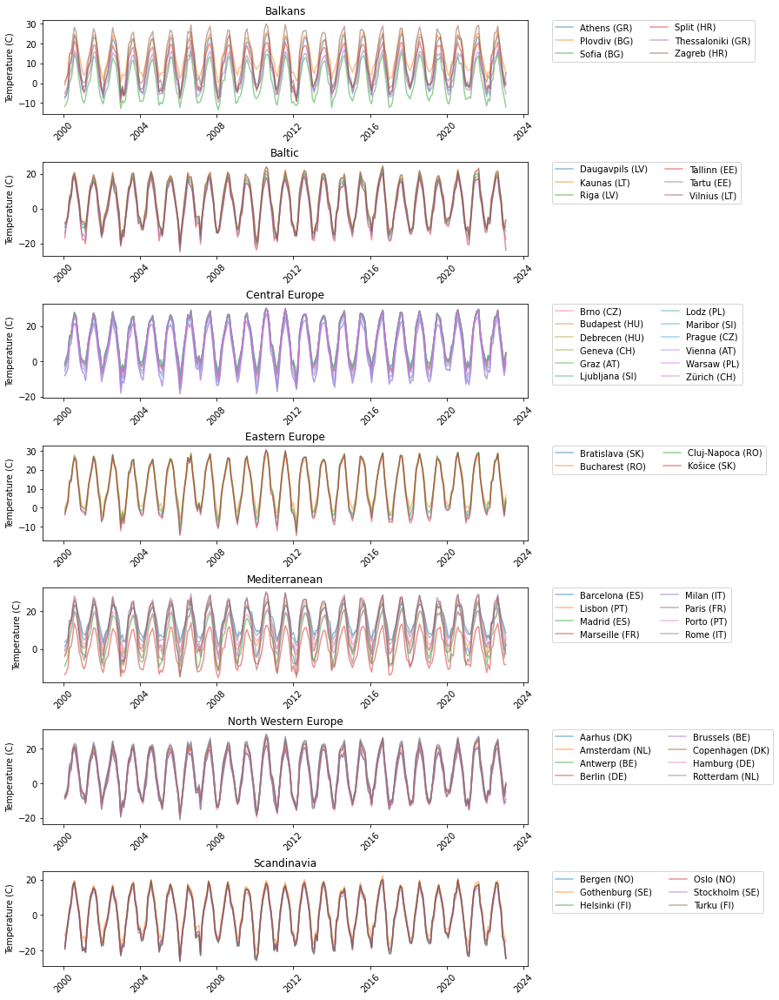

In [11]:
df = weather_df.copy()
# groupby region, city, and country and resample to weekly
df = df.groupby(['region', 'city', 'country']).resample('M', on='time').mean().reset_index()
df['label'] = df['city'] + ' (' + df['country'] + ')'

fig, axes = plt.subplots(7, 1, figsize=(10, 20), sharex=False)
for i, region in enumerate(df['region'].unique()):
    sns.lineplot(data=df[df['region'] == region], x='time', y='temperature_2m_avg', hue='label', ax=axes[i])
    # Smaller line width
    for j in range(0, len(axes[i].lines)):
        axes[i].lines[j].set_linewidth(1.5)
        axes[i].lines[j].set_alpha(0.5)
    axes[i].set_title(region)
    # Set axis labels to '' to avoid overlapping
    axes[i].set_ylabel('Temperature (C)')
    axes[i].set_xlabel('')
    # Rotate xticks
    axes[i].tick_params(axis='x', rotation=45)
    # Legends outside the plot
    axes[i].legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., ncol = 2)
    # Create more space between the plots
fig.subplots_adjust(hspace=0.5)
plt.show()

###### 2.1.1: Wind

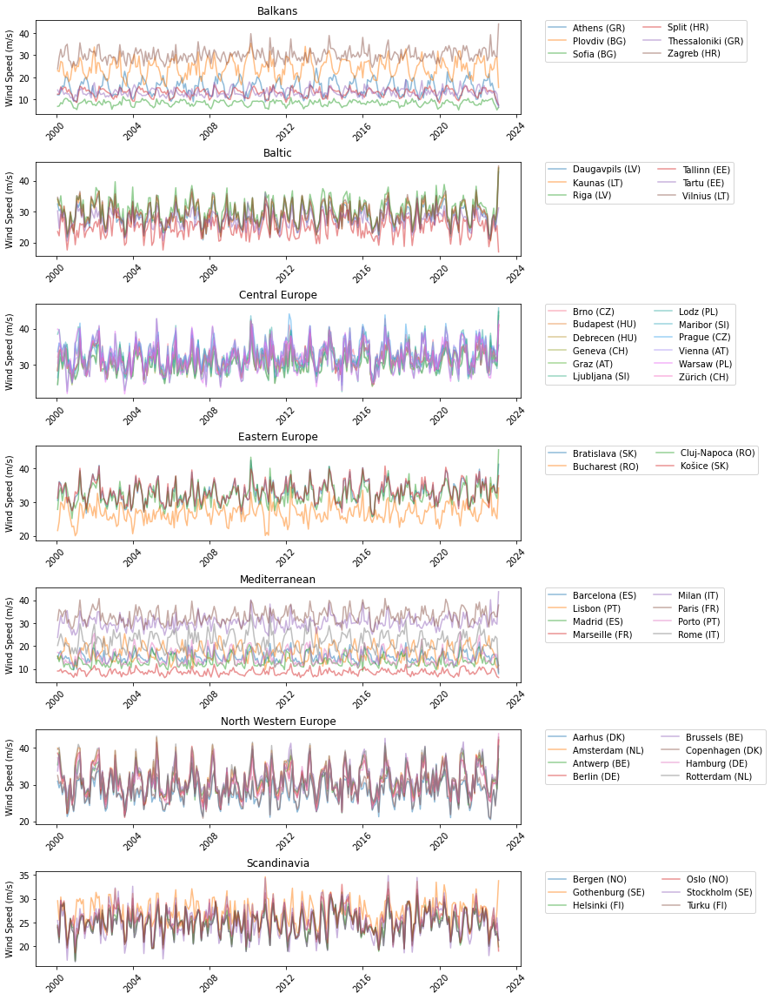

In [12]:
fig, axes = plt.subplots(7, 1, figsize=(10, 20), sharex=False)
for i, region in enumerate(df['region'].unique()):
    sns.lineplot(data=df[df['region'] == region], x='time', y='windspeed_100m_max', hue='label', ax=axes[i])
    # Smaller line width
    for j in range(0, len(axes[i].lines)):
        axes[i].lines[j].set_linewidth(1.5)
        axes[i].lines[j].set_alpha(0.5)
    axes[i].set_title(region)
    # Set axis labels to '' to avoid overlapping
    axes[i].set_ylabel('Wind Speed (m/s)')
    axes[i].set_xlabel('')
    # Rotate xticks
    axes[i].tick_params(axis='x', rotation=45)
    # Legends outside the plot
    axes[i].legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., ncol = 2)
    # Create more space between the plots
fig.subplots_adjust(hspace=0.5)
plt.show()

#### 2.2: Energy

In [13]:
hourly_entsoe_day_ahead_forecast = get_hourly_entsoe_day_ahead_forecast(START_DATE, END_DATE, list(TSO_COUNTRIES.keys()))
hourly_entsoe_generation_production = get_hourly_entsoe_generation_production(START_DATE, END_DATE, list(TSO_COUNTRIES.keys()))
hourly_entsoe_day_ahead_prices = get_hourly_entsoe_day_ahead_prices(START_DATE, END_DATE, list(TSO_COUNTRIES.keys()))

hourly_entsoe_day_ahead_prices.head(5)

,timestamp,price_area,country_code,price
0,2017-12-31 00:00:00+00:00,BE,BE,14.04
1,2017-12-31 00:00:00+00:00,BG,BG,11.66
2,2017-12-31 00:00:00+00:00,CH,CH,36.09
3,2017-12-31 00:00:00+00:00,CZ,CZ,-0.10
4,2017-12-31 00:00:00+00:00,DE_AT_LU,DE,-4.99


In [248]:
# Sample plants
unit_generation_plants = get_unit_generation_plants()
fuel_samples = {
    'Solar': 5,
    'Wind': 5,
    'Hydro': 5,
    'Nuclear': 5,
    'Fossil Gas': 5,
    'Fossil Coal' : 5
}
sampled_plants = []
for fuel, sample_size in fuel_samples.items():
    sampled_plants += list(unit_generation_plants[unit_generation_plants['plant_type'].str.contains(fuel)].sample(sample_size, random_state = SEED)['eic_code'])

unit_generation_plants = unit_generation_plants[unit_generation_plants['eic_code'].isin(sampled_plants)]
unit_generation_plants.head(5)

NameError: name 'server' is not defined

In [261]:
# Create a table with the unit_generation_plants. This is for the report, therefore, plant type can be first level and second level can be (eic_long_name,country_code,ic_code) 

# Pivot the DataFrame to have plant_type as the first level column
table_df = unit_generation_plants
table_df['label'] = table_df['eic_long_name'] + ' (' + table_df['country_code'] + ')'
pivot_df = unit_generation_plants.pivot(columns='plant_type', values=['label'])

# Shift all values up, cause now there is a lot of NaNs
pivot_df = pivot_df.apply(lambda x: pd.Series(x.dropna().values))
pivot_df

label                                    \
plant_type Fossil Coal-derived gas                        Fossil Gas   
0                   Hamborn 4 (DE)                    Diemen 33 (NL)   
1                 Huckingen_A (DE)             GDFSUEZ_NL_EC-22 (NL)   
2                   Ruhrort 4 (DE)  Gen Unit AGIOS NIKOLAOS ΙΙ  (GR)   
3             UP_LVTRNTCET3_1 (IT)    Gen Unit ELPEDISON_THISVI (GR)   
4                 UP_SARLUX_1 (IT)                UP_PRIOLO_C_2 (IT)   

                                                             \
plant_type Hydro Pumped Storage       Hydro Water Reservoir   
0             PSKW-LIMMERN (CH)  BLAFALLVG1      HYDRO (NO)   
1                Vianden_5 (DE)                   ENDG (ES)   
2                           NaN                         NaN   
3                           NaN                         NaN   
4                           NaN                         NaN   

                                                   \
plant_type                Nuclear           Solar   
0                     DOEL 4 (BE)    FV1014  (ES)   
1                   PALUEL 3 (FR)    FVORIOL (ES)   
2                    PENLY 2 (FR)  GUILLENAS (ES)   
3           TRICASTIN (LE) 2 (FR)       Mula (ES)   
4                       UF G (ES)     TALAYU (ES)   

                                                       
plant_type                              Wind Offshore  
0                                Belwind Phase 1 (BE)  
1           Danish Kriegers Flak Generation Unit (DK)  
2                    Horns Rev C generation unit (DK)  
3               Thorntonbank - C-Power - Area SW (BE)  
4                                                 NaN

In [15]:
# Get the hourly generation for the sampled plants
hourly_entsoe_unit_generation = get_hourly_entsoe_unit_generation(dt.date(2020,1,1), END_DATE, list(unit_generation_plants['eic_code'].unique()))
hourly_entsoe_unit_generation.head(5)

,timestamp,plant_type,plant_label,country_code,price_area,eic_code,generation
0,2022-11-30 00:00:00+00:00,Wind Offshore,Belwind Phase 1,BE,BE,22WBELWIN1500271,0.0
1,2022-11-30 01:00:00+00:00,Wind Offshore,Belwind Phase 1,BE,BE,22WBELWIN1500271,0.0
2,2022-11-30 02:00:00+00:00,Wind Offshore,Belwind Phase 1,BE,BE,22WBELWIN1500271,0.0
3,2022-11-30 03:00:00+00:00,Wind Offshore,Belwind Phase 1,BE,BE,22WBELWIN1500271,0.0
4,2022-11-30 04:00:00+00:00,Wind Offshore,Belwind Phase 1,BE,BE,22WBELWIN1500271,0.0


##### 2.2.1: Summary

###### Prices

In [16]:
# Add season to the data
hourly_entsoe_day_ahead_prices['season'] = hourly_entsoe_day_ahead_prices['timestamp'].apply(lambda x: 0 if x.month in [12,1,2] else (1 if x.month in [3,4,5] else (2 if x.month in [6,7,8] else 3)))

entsoe_dap_summary = hourly_entsoe_day_ahead_prices.groupby(['country_code', 'price_area', 'season']).agg({
    'price': ['median', 'var']
})

# Reset index
entsoe_dap_summary = entsoe_dap_summary.reset_index()

# Melt to normal format again
entsoe_dap_summary = entsoe_dap_summary.melt(id_vars=['country_code', 'price_area', 'season'], var_name = ['variable', 'statistic'], value_name='value')
# Sort by country and city
entsoe_dap_summary = entsoe_dap_summary.sort_values(by=['country_code', 'price_area', 'variable','statistic','season'])
# Pivot
pivot_summary = entsoe_dap_summary.pivot(index=['country_code', 'price_area'], columns = ['variable', 'statistic', 'season'], values='value')
# Define the background gradients for each variable
gradients = {
    'price': 'bone',
}
# Loop over the gradients and apply them to the appropriate subsets of the DataFrame
styled_pivot_summary = pivot_summary.style
for variable, cmap in gradients.items():
    for statistic in pivot_summary.columns.levels[1]:
        seasons = pivot_summary.columns.levels[2]
        subset = [(variable, statistic, season) for season in seasons]
        styled_pivot_summary = styled_pivot_summary.background_gradient(cmap=cmap, subset=subset)
        # Float format 3 decimals
        
styled_pivot_summary = styled_pivot_summary.format("{:.3f}")
styled_pivot_summary

###### Unit Generation

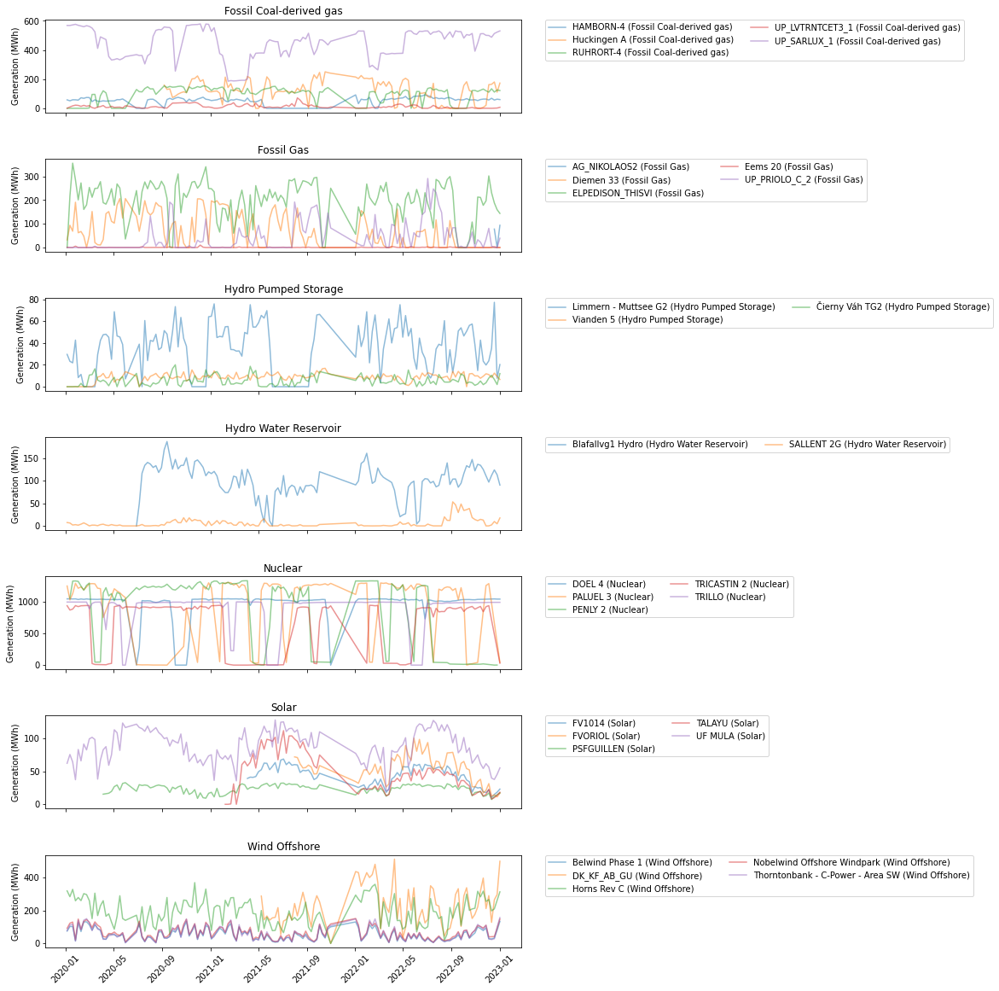

In [17]:
df = hourly_entsoe_unit_generation.copy()
# groupby region, city, and country and resample to weekly
df = df.groupby(['plant_type', 'plant_label']).resample('W', on='timestamp').mean().reset_index()
df['label'] = df['plant_label'] + ' (' + df['plant_type'] + ')'

fig, axes = plt.subplots(7, 1, figsize=(10, 20), sharex=True)
for i, region in enumerate(df['plant_type'].unique()):
    sns.lineplot(data=df[df['plant_type'] == region], x='timestamp', y='generation', hue='label', ax=axes[i])
    # Smaller line width
    for j in range(0, len(axes[i].lines)):
        axes[i].lines[j].set_linewidth(1.5)
        axes[i].lines[j].set_alpha(0.5)
    axes[i].set_title(region)
    # Set axis labels to '' to avoid overlapping
    axes[i].set_ylabel('Generation (MWh)')
    axes[i].set_xlabel('')
    # Rotate xticks
    axes[i].tick_params(axis='x', rotation=45)
    # Legends outside the plot
    axes[i].legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., ncol = 2)
    # Create more space between the plots
fig.subplots_adjust(hspace=0.5)
plt.show()

#### 2.3: Other

In [163]:
farms_df = pd.read_csv(r"C:\Users\Nicky\Documents\Data\PowerPlants\thewindpower\Final\windfarms_processed_final.csv", delimiter = ',')
turbines_df = pd.read_csv(r"C:\Users\Nicky\Documents\Data\PowerPlants\thewindpower\Final\turbines_windpower_final.csv", delimiter = ',')
turbines_df.head(5)

,id,manufacturer,model,rated_power,rotor_diameter,wind_class,offshore,swept_area,specific_area,n_blades,...,voltage,hub_height,min_hub_height,max_hub_height,power_curve,wind_curve,commisioning,update,url,simulated
0,0,China Creative Wind Energy (Chine),CCWE-1500/87.DF,1500,87.0,NaN,no,5945.4495,NaN,3,...,690.0,68.5,NaN,NaN,"[0,0,0,0,0,0,23.05,36.265,54.13,77.467,107.111...","[0,0.5,1,1.5,2,2.5,3,3.5,4,4.5,5,5.5,6,6.5,7,7...",NaN,25 November 2019,www.thewindpower.net/turbine_en_1000_china-cre...,True
1,1,XEMC-Darwind (Pays-Bas),XD137-4000,4000,137.0,IEC II,no,14743.0495,NaN,3,...,900.0,100.0,100.0,140.0,"[0, 0, 0, 0, 0, 0, 0, 95, 197, 330, 465, 630, ...","[0, 0.5, 1, 1.5, 2, 2.5, 3, 3.5, 4, 4.5, 5, 5....",NaN,10 February 2021,www.thewindpower.net/turbine_en_1001_xemc-darw...,False
2,2,Guodian United Power (Chine),UP154,6000,154.0,NaN,no,18628.9180,NaN,3,...,NaN,102.0,NaN,NaN,"[0,0,0,0,0,0,92.198,145.059,216.518,309.867,42...","[0,0.5,1,1.5,2,2.5,3,3.5,4,4.5,5,5.5,6,6.5,7,7...",NaN,7 June 2018,www.thewindpower.net/turbine_en_1002_guodian-u...,True
3,3,Acciona (Espagne),AW-3000/132,3000,132.0,IEC IIIb/S,no,13686.5520,NaN,3,...,12000.0,84.0,84.0,137.5,"[0,0,0,0,0,0,46.099,72.53,108.259,154.933,214....","[0,0.5,1,1.5,2,2.5,3,3.5,4,4.5,5,5.5,6,6.5,7,7...",2014.0,18 January 2021,www.thewindpower.net/turbine_en_1003_acciona.php,True
4,4,Acciona (Espagne),AW-3000/132,3000,132.0,IEC IIIb/S,no,13686.5520,NaN,3,...,12000.0,84.0,84.0,137.5,"[0,0,0,0,0,0,46.099,72.53,108.259,154.933,214....","[0,0.5,1,1.5,2,2.5,3,3.5,4,4.5,5,5.5,6,6.5,7,7...",2014.0,18 January 2021,www.thewindpower.net/turbine_en_1003_acciona_a...,True


In [173]:
farms_df.columns

Index(['id_parent', 'name', 'country', 'zone_parent', 'name_2', 'id_child',
       'city', 'n_turbines', 'type_turbine', 'nominal_power', 'status',
       'zone_child', 'developer', 'operator', 'latitude', 'longitude',
       'precise_location', 'update', 'url', 'id_turbine', 'continent',
       'commisioning', 'decommisioning', 'imputed'],
      dtype='object')

In [196]:
# Convert nominal_power to MW
import plotly.express as px
farms_df['nominal_power_mw'] = farms_df['nominal_power'] / 1000

fig = px.scatter_mapbox(farms_df, lat="latitude", lon="longitude", hover_name="name", hover_data=['name', "nominal_power", "country", "type_turbine"], 
                        color="nominal_power_mw", size="nominal_power_mw", color_continuous_scale=px.colors.sequential.Viridis, 
                        size_max=15, zoom=3, height=700, width=1000)


fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})

# Drop the legend
#fig.update_layout(coloraxis_showscale=False)
fig.update_layout(
    coloraxis=dict(
        colorbar=dict(
 thicknessmode="pixels",  # Set thickness mode to pixels
            thickness=20,  # Adjust the thickness of the colorbar
            lenmode="fraction",  # Set length mode to fraction of the plot
            len=0.5,  # Adjust the length of the colorbar
            xanchor="left",  # Position the colorbar on the right side
            x=0.05,  # Adjust the x position of the colorbar
            yanchor="middle",  # Position the colorbar in the middle vertically
            y=0.5,  # Adjust the y position of the colorbar
            title="Capacity (MW)",  # Set legend title
            title_font=dict(size=14),  # Adjust legend title font size
            tickfont=dict(size=12),  # Adjust legend tick font size
        ),
    )
)
fig.show()

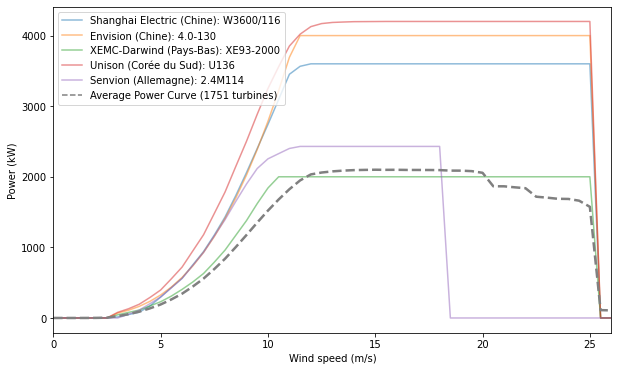

In [224]:
fig, ax = plt.subplots(figsize=(10, 6))

# Sample 5 random models from the turbines_df
turbine_models = turbines_df['model'].unique()
np.random.shuffle(turbine_models)
average_power_curve = np.zeros(60)

for i, model in enumerate(turbine_models):
    manufacturer = turbines_df[turbines_df['model'] == model]['manufacturer'].iloc[0]
    power_curve = turbines_df[turbines_df['model'] == model]['power_curve'].iloc[0]
    # Convert string to list
    power_curve = power_curve.replace('[', '').replace(']', '').split(',')
    wind_curve = turbines_df[turbines_df['model'] == model]['wind_curve'].iloc[0]
    # Convert string to list
    wind_curve = wind_curve.replace('[', '').replace(']', '').split(',')
    # Convert to float
    try:
        power_curve = [float(i) for i in power_curve]
        wind_curve = [float(i) for i in wind_curve]

        # Make sure array has length of 60
        power_curve = power_curve[:60]
        wind_curve = wind_curve[:60]
        average_power_curve += np.array(power_curve)
        if i > 4:
            continue
        # Plot the power curve
        sns.lineplot(x=wind_curve, y=power_curve, label=f'{manufacturer}: {model}')
        # Smaller line width
        for j in range(0, len(ax.lines)):
            ax.lines[j].set_linewidth(1.5)
            ax.lines[j].set_alpha(0.5)
        ax.set_ylabel('Power (kW)')
        ax.set_xlabel('Wind speed (m/s)')
        # xlimit at 32
        ax.set_xlim(0, 26)
        # Legends inside the plot
        ax.legend(loc='upper left')
    except:
        continue

average_power_curve /= len(turbine_models)

# Plot the average power curve
sns.lineplot(x=wind_curve, y=average_power_curve, label=f'Average Power Curve ({len(turbine_models)} turbines)', color= 'gray', linestyle= '--')
ax.lines[-1].set_linewidth(2.5)

plt.show()

In [227]:
farms_df.columns

Index(['id_parent', 'name', 'country', 'zone_parent', 'name_2', 'id_child',
       'city', 'n_turbines', 'type_turbine', 'nominal_power', 'status',
       'zone_child', 'developer', 'operator', 'latitude', 'longitude',
       'precise_location', 'update', 'url', 'id_turbine', 'continent',
       'commisioning', 'decommisioning', 'imputed', 'nominal_power_MW',
       'nominal_power_mw'],
      dtype='object')

In [18]:
min_date = pd.to_datetime(min(hourly_entsoe_day_ahead_prices['timestamp']), utc = True)
w_hourly['time'] = pd.to_datetime(w_hourly['time'], utc = True)
quadrant_df = (w_hourly[w_hourly['time'] >= min_date]).groupby(['country', 'time']).mean().reset_index().merge(
    hourly_entsoe_day_ahead_prices,
    left_on=['country', 'time'],
    right_on=['country_code', 'timestamp'],
).merge(
    hourly_entsoe_generation_production,
    left_on=['country', 'time'],
    right_on=['country_code', 'timestamp'],
)
quadrant_df.head(5)

,country,time,temperature_2m,windspeed_10m,windspeed_100m,windgusts_10m,latitude,longitude,timestamp_x,price_area_x,...,hydro_pumped_storage,hydro_run_of_river_and_poundage,hydro_water_reservoir,nuclear,other,other_renewable,solar,waste,wind_offshore,wind_onshore
0,AT,2018-09-30 22:00:00+00:00,11.60,17.85,27.90,28.80,47.639445,15.906662,2018-09-30 22:00:00+00:00,AT,...,21.25,1554.75,277.00,NaN,22.0,0.0,0.0,100.0,NaN,1786.0
1,AT,2018-09-30 23:00:00+00:00,11.20,17.60,26.45,28.05,47.639445,15.906662,2018-09-30 23:00:00+00:00,AT,...,0.00,1517.50,183.00,NaN,22.0,0.0,0.0,100.0,NaN,1737.0
2,AT,2018-10-01 00:00:00+00:00,10.75,16.90,26.40,26.80,47.639445,15.906662,2018-10-01 00:00:00+00:00,AT,...,0.00,1551.25,73.25,NaN,22.0,0.0,0.0,100.0,NaN,1464.0
3,AT,2018-10-01 01:00:00+00:00,10.25,16.90,26.10,25.55,47.639445,15.906662,2018-10-01 01:00:00+00:00,AT,...,0.00,1584.00,65.75,NaN,22.0,0.0,0.0,100.0,NaN,1164.0
4,AT,2018-10-01 02:00:00+00:00,9.80,16.50,25.75,25.75,47.639445,15.906662,2018-10-01 02:00:00+00:00,AT,...,0.00,1640.75,124.50,NaN,22.0,0.0,0.0,100.0,NaN,984.0


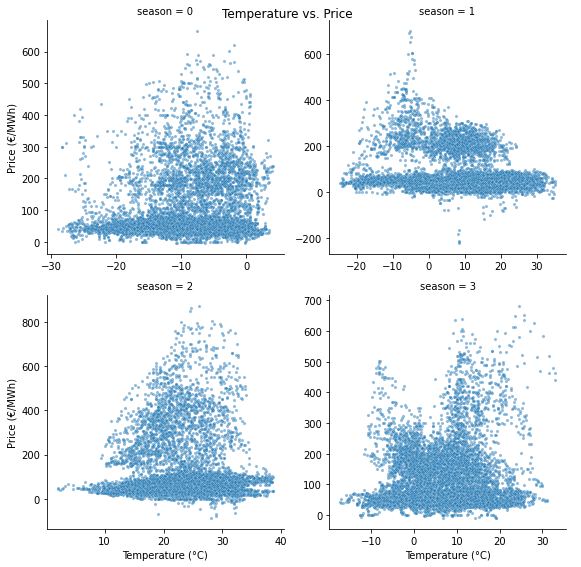

In [19]:
# Create four quadrant plots having the following for every country (using grid):
# (x,y) = (temperature, price)
# (x,y) = (wind_speed, price)

# Create a grid of plots
g = sns.FacetGrid(quadrant_df[quadrant_df['country']=='NL'], col="season", col_wrap=2, height=4, sharex=False, sharey=False)

# Plot the scatter plot
g.map(sns.scatterplot, "temperature_2m", "price", alpha=0.5, s=10)
# Set the x and y axis labels
g.set_axis_labels("Temperature (°C)", "Price (€/MWh)")
# Set the title
g.fig.suptitle('Temperature vs. Price')
# Add a legend
g.add_legend()
# Set a xlim (-20,40) and ylim (-500,800)
#g.set(xlim=(-20, 40), ylim=(-200, 800))
# Add the quadrants as vertical and horizontal lines
#g.map(plt.axvline, x=0, color="k", linestyle="--", lw=1)
#g.map(plt.axhline, y=0, color="k", linestyle="--", lw=1)
# Show the plot
plt.show()

#### 2.99: Data Dump

In [21]:
del server

In [38]:
# Dump the IPYNB environment for reproducibility
pickle.dump_session('notebook_env.db')

In [8]:
# Load the IPYNB environment for reproducibility
pickle.load_session('notebook_env.db')

c:\Users\Nicky\anaconda3\envs\thesis\lib\site-packages\dill\_dill.py:419: UserWarning: This figure was saved with matplotlib version 3.5.1 and is unlikely to function correctly.
  obj = StockUnpickler.load(self)


### 3.0: Methodology

In [4]:
weather_df.head(5)

,region,country,city,time,temperature_2m_min,temperature_2m_max,windspeed_10m_max,windspeed_100m_max,temperature_2m_avg,season
0,Balkans,BG,Plovdiv,2000-01-01,6.1,18.2,19.9,38.5,12.15,0
1,Balkans,BG,Plovdiv,2000-01-02,6.4,11.3,8.3,13.7,8.85,0
2,Balkans,BG,Plovdiv,2000-01-03,4.5,8.2,10.4,16.6,6.35,0
3,Balkans,BG,Plovdiv,2000-01-04,3.3,4.9,8.2,15.7,4.10,0
4,Balkans,BG,Plovdiv,2000-01-05,1.3,5.2,6.0,8.8,3.25,0


#### 3.1: Time Series Decomposition

##### 3.1.1: Temperature Dynamics

We will assume that temperature $T(t)$ at time $t \geq 0$ follows CARMA(p,q) dynamics for $q < p$, such that:

\begin{equation}
    T(t)=\Lambda(t) + Y(t),
\end{equation}

where $\Lambda(t)$ a seasonality function and $Y(t)=b'\mathbf{x}(t)$.

In other words, the CARMA(p,q) implies temperature mean-reverts to the seasonal level $\Lambda(t)$. In their empirical research, Benth (2012) argued for an AR(3) structure for different weather stations in Lithuania. Additionally, they chose a seasonal component defined as:

\begin{equation}
\Lambda_{t} = 
a_{0} + a_{1}t + a_{2} \cos\frac{2\pi t}{365} + a_{3} \sin\frac{2\pi t}{365}
.
\end{equation}

During the literature review, we found multiple seasonality functions. For instance, Cabrera (2010) used a truncated Fourier series defined as:

\begin{equation}
\Lambda_{t} = a_{0} + a_{1}t + \sum_{l=1}^{L} a_{l+1} \cos {\huge \{} \frac{2\pi (t - d_{l})}{l \cdot 365} {\huge \}}.
\end{equation}

where the average temperature and global warming are indicated (in both seasonality functions) by the coefficients $a_{0}$ and $a_{1}$ respectively. Notice that the speed of the seasonal process is defined as $\frac{2\pi}{365}$. This does not account for leap years, which will result in out-of-sync models.  Whilst using a sample size of approximately 100 years, standard in most temperature modeling studies, this accounts for a synchronization loss of approximately 25 days when not accounting for leap years. Therefore, we alter the speed to be $\frac{2\pi}{365.25}$.

In [28]:
from scipy.optimize import curve_fit

def seasonality_benth(x, a_0, a_1, a_2, a_3):
    omega = 2*np.pi/365.25
    y_pred = a_0 + a_1*x + a_2*np.cos(omega*x) + a_3*np.sin(omega*x)
    return y_pred

def seasonality_cabrera(x, a_0, a_1, a_2,a_3, d_1, d_2):
    omega = 2*np.pi/365.25
    y_pred = a_0 + a_1*x + a_2*np.cos(omega*(x-d_1)) + a_3*np.sin((omega /2 )*(x-d_2))
    return y_pred

def RSS(y, y_pred):
    return np.sqrt(np.sum((y-y_pred)**2))

###### Example: Seasonality

Benth parameters:
a_0 :  4.17  CI ~normally [3.94e+00,4.39e+00]
a_1 :  9.12e-05  CI ~normally [4.58e-05,1.37e-04]
a_2 :  -16.0  CI ~normally [-1.61e+01,-1.58e+01]
a_3 :  -4.36  CI ~normally [-4.52e+00,-4.21e+00]
Cabrera parameters:
a_0 :  4.19  CI ~normally [3.97e+00,4.41e+00]
a_1 :  8.58e-05  CI ~normally [4.04e-05,1.31e-04]
a_2 :  -16.6  CI ~normally [-1.67e+01,-1.64e+01]
a_3 :  0.353  CI ~normally [2.00e-01,5.06e-01]
d_1 :  -3.5e+02  CI ~normally [-3.50e+02,-3.49e+02]
d_2 :  -93.5  CI ~normally [-1.43e+02,-4.37e+01]
Benth RSS: 4.5e+02
Cabrera RSS: 4.49e+02


<AxesSubplot: xlabel='time'>

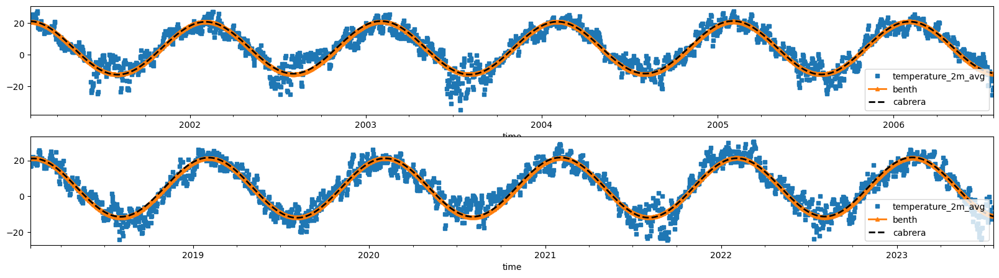

In [29]:
# --- Example: Fit the data to Vilnius --- #
example_df = weather_df[weather_df['city'] == 'Vilnius'][200:]
# Sort by time
example_df = example_df.sort_values(by='time')[['time','temperature_2m_avg']]
example_df = example_df.set_index('time')

# Convert the index to ordinal
if isinstance(example_df.index , pd.DatetimeIndex):
    first_ord = example_df.index.map(dt.datetime.toordinal)[0]
    # The index needs to correspond to the day of the year, so if toordinal is 7800, but the day of the year is 200, we need to subtract 7600
    first_day = dt.datetime.fromordinal(first_ord).timetuple().tm_yday
    example_df.index=example_df.index.map(dt.datetime.toordinal)

# Shift the index to start at 0
example_df.index = example_df.index - first_ord + (first_day - 1)

# Fit the data
params_benth, cov_benth = curve_fit(seasonality_benth, example_df.index, example_df['temperature_2m_avg'], method = 'lm')
params_cabrera, cov_cabrera = curve_fit(seasonality_cabrera, example_df.index, example_df['temperature_2m_avg'], method = 'lm')
# Print the parameters
params_benth_names = ['a_0', 'a_1', 'a_2', 'a_3']
params_cabrera_names = ['a_0', 'a_1', 'a_2', 'a_3', 'd_1', 'd_2']

print('Benth parameters:')
std_dev = np.sqrt(np.diag(cov_benth))
for name, p, sd in zip( params_benth_names, params_benth, std_dev):
    print('{0} :  {1:0.3}  CI ~normally [{2:0.2e},{3:0.2e}]'.format(name, p, p-1.96*sd,p+1.96*sd))

print('Cabrera parameters:')
std_dev = np.sqrt(np.diag(cov_cabrera))
for name, p, sd in zip( params_cabrera_names, params_cabrera, std_dev):
    print('{0} :  {1:0.3}  CI ~normally [{2:0.2e},{3:0.2e}]'.format(name, p, p-1.96*sd,p+1.96*sd))

print('Benth RSS: {0:0.3}'.format(RSS(example_df['temperature_2m_avg'], seasonality_benth(example_df.index, *params_benth))))
print('Cabrera RSS: {0:0.3}'.format(RSS(example_df['temperature_2m_avg'], seasonality_cabrera(example_df.index, *params_cabrera))))

example_df['benth'] = seasonality_benth(example_df.index, *params_benth)
example_df['cabrera'] = seasonality_cabrera(example_df.index, *params_cabrera)   
# Convert the index back to datetime
example_df['time'] = (example_df.index + first_ord).map(dt.datetime.fromordinal)

# Plot first and last years of the data (2 subplots)
fig, axes = plt.subplots(2, 1, figsize=(20, 5), sharex=False)
example_df[:2000].plot(ax=axes[0], x='time', y=['temperature_2m_avg', 'benth', 'cabrera'], style=['s','^-','k--'] , markersize=4, linewidth=2 )
example_df[-2000:].plot(ax=axes[1], x='time', y=['temperature_2m_avg', 'benth', 'cabrera'], style=['s','^-','k--'] , markersize=4, linewidth=2 )
# --- Example: Fit the data to Vilnius --- #

We see that benth or cabrera are very similar in their seasonality approach, therefore we choose the most parsimonious model. Let's quickly glance at the residuals

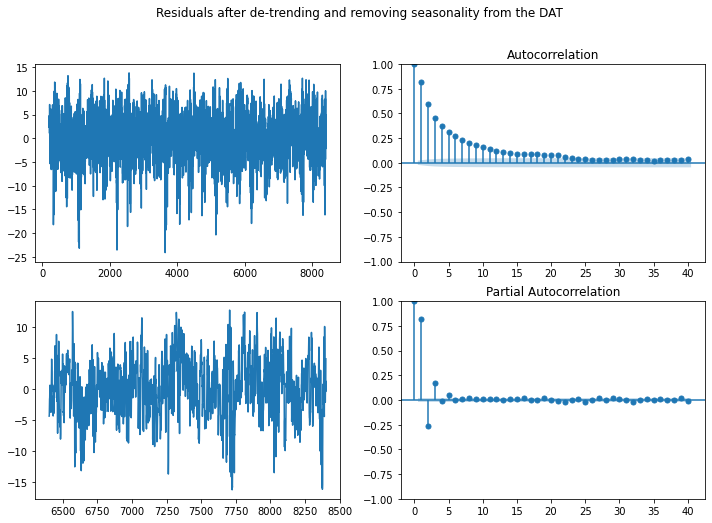

In [27]:
example_df['residuals_benth'] = example_df['temperature_2m_avg'] - example_df['benth']
# import plot_acf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

fig, axs = plt.subplots(2,2, figsize=(12,8))
fig.suptitle('Residuals after de-trending and removing seasonality from the DAT')
axs[0,0].plot(example_df['residuals_benth'])
axs[1,0].plot(example_df['residuals_benth'][-2000:])
plot_acf(example_df['residuals_benth'], lags=40, ax=axs[0,1])
plot_pacf(example_df['residuals_benth'], lags=40, ax=axs[1,1])
plt.show()

Next, we start fitting the autoregressive model on the residuals of the seasonalized temperatures.

In [26]:
# We start fitting AR model on the residuals of the seasonalized temperatures, for this we need a function that takes in the seasonality_func,
# The temperatures and returns optimal AR parameters
from symfit import parameters, variables, sin, cos, Fit

def fourier_series(x, f, n=0):
    """
    Returns a symbolic fourier series of order `n`.
    :param n: Order of the fourier series.
    :param x: Independent variable
    :param f: Frequency of the fourier series
    """
    # Make the parameter objects for all the terms
    a0, *cos_a = parameters(','.join(['a{}'.format(i) for i in range(0, n + 1)]))
    sin_b = parameters(','.join(['b{}'.format(i) for i in range(1, n + 1)]))
    # Construct the series
    series = a0 + sum(ai * cos(i * f * x) + bi * sin(i * f * x)
                     for i, (ai, bi) in enumerate(zip(cos_a, sin_b), start=1))
    return series

def autoregressive_constant_variance_fit(df, seasonality_mean_func,variable = 'temperature_2m_avg', max_ar_lag=6):
    # Fit the seasonality function
    params, cov = curve_fit(seasonality_mean_func, df.index, df[variable], method = 'lm')
    # Seasonalize the variable
    df['seasonalized'] = df[variable] - seasonality_mean_func(df.index, *params)
    # Select the optimal lag
    optimal = ar_select_order(df['seasonalized'], maxlag=max_ar_lag, ic='aic', trend='n')
    # Fit the model using AutoReg
    model = AutoReg(df['seasonalized'], lags=optimal.ar_lags, trend='n')
    model_fit = model.fit()
    # Add the constant variance residuals to the dataframe
    df['residuals_cv'] = model_fit.resid

    return {'seasonality_function' : (params, cov), 'ar_model' : model_fit, 'result' : df}

# We are now going to create a function that takes in a time varying variance
# Notice, that these functions estimate the parameters one after the other. TODO: is it different from estimating them together?
def autoregressive_time_varying_variance_fit(df, seasonality_mean_func, variable = 'temperature_2m_avg', max_ar_lag=6, fourier_order = 4):
    # Fit the seasonality function
    params, cov = curve_fit(seasonality_mean_func, df.index, df[variable], method = 'lm')
    # Seasonalize the variable
    df['seasonalized'] = df[variable] - seasonality_mean_func(df.index, *params)
    # Select the optimal lag
    optimal = ar_select_order(df['seasonalized'], maxlag=max_ar_lag, ic='aic', trend='n')
    # Fit the model using AutoReg
    model = AutoReg(df['seasonalized'], lags=optimal.ar_lags, trend='n')
    model_fit = model.fit()
    # Add the constant variance residuals to the dataframe
    df['residuals_cv'] = model_fit.resid
    # Fit the variance function
    x, y = variables('x, y')
    # Within Benth (2012), the variance is modelled using 4 fourier terms, we define it as fourier_order
    fourier_model_dict = {y: fourier_series(x, f=2*np.pi/365.25, n=fourier_order)}
    # Fit the fourier model, recall that we have used AR(p) model, so we need to use a time shift of p (the maximum lag)
    time_shift = np.max(optimal.ar_lags)
    
    fourier_model = Fit(fourier_model_dict, x=df[time_shift:].index, y=df[time_shift:]['residuals_cv']**2)
    fourier_model_fit = fourier_model.execute()
    # Add the time varying variance residuals to the dataframe
    df['fitted_variance'] = fourier_model_fit.model(x=df.index, **fourier_model_fit.params).y
    df['residuals_tv'] = df['residuals_cv'] / np.sqrt(df['fitted_variance'])
    
    # Return the seasonality function parameters, the AR model, the fourier model result and the dataframe
    return {'seasonality_function' : (params, cov), 'ar_model' : model_fit, 'fourier_model' : fourier_model_fit, 'result' : df}

###### Example: Time Varying Volatility

Fourier Series Parameters:
a0 7.248543889
a1 3.513258599
a2 2.119890182
a3 1.661853611
a4 -0.02292007
b1 1.343196205
b2 0.205977663
b3 0.950172803
b4 -0.274171303


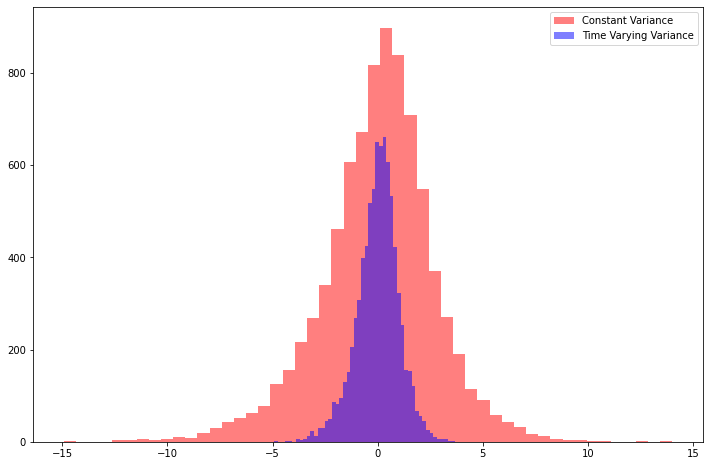

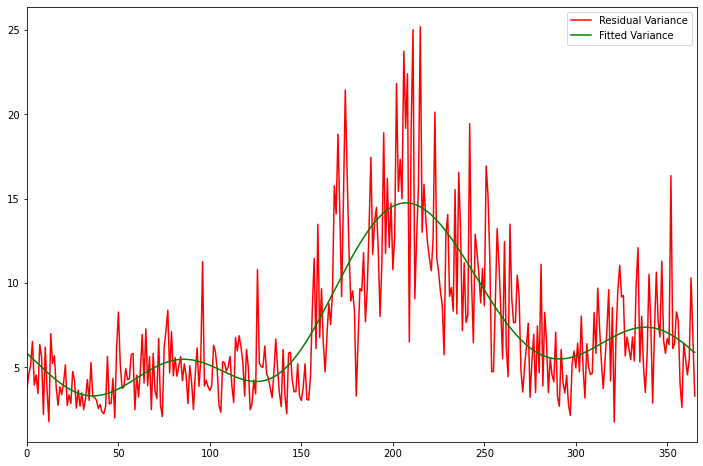

In [29]:
# --- Example: Fit the data to Vilnius --- #
example_result = autoregressive_time_varying_variance_fit(example_df, seasonality_benth, variable = 'temperature_2m_avg', max_ar_lag=3, fourier_order = 4)

print("Fourier Series Parameters:")
for i,v in example_result['fourier_model'].params.items():
    print(round(v,9))

# Plot the histogram of the residuals (both constant and time varying variance) overlayed on each other
fig, ax = plt.subplots(figsize=(12,8))
ax.hist(example_result['result']['residuals_cv'], bins=50, alpha=0.5, label='Constant Variance', color='red')
ax.hist(example_result['result']['residuals_tv'], bins=50, alpha=0.5, label='Time Varying Variance', color='blue')
ax.legend(loc='upper right')
plt.show()

example_df = example_result['result']
# Plot the volatility captured by the fourier series and the actual volatility by day (lineplot)
example_df['day'] = example_df['time'].dt.dayofyear
example_summary_df = example_df.groupby('day').agg({'residuals_cv' : 'var', 'fitted_variance' : 'mean'}).reset_index()

fig, ax = plt.subplots(figsize=(12,8))
ax.plot(example_summary_df['residuals_cv'], label='Residual Variance', color='red')
ax.plot(example_summary_df['fitted_variance'], label='Fitted Variance', color='green')
ax.legend(loc='upper right')
plt.xlim(0,366)
plt.show()
# --- Example: Fit the data to Vilnius --- #

##### 3.1.2: Wind Dynamics

Benth (2010) employed a Box-Cox transformation to achieve symmetry in wind speed data before fitting an AR(4) process with seasonal mean and volatility. We consider here the general transformation of wind speed data when defining continuous time dynamics. Therefore, we define the *wind speed* $W(t)$ at time $t \geq 0$ to be:

\begin{equation}
    W(t)=
    \begin{cases}
      \big [ 
      \lambda (\Lambda(t) + Y(t))
      + 1 \big ]^{1/\lambda} &, \lambda \neq 0,
      \\
      \exp (\Lambda(t) + Y(t)) &, \lambda=0,
    \end{cases}
\end{equation}

for a constant $\lambda$ and $\Lambda(t)$ a seasonal function as in the previous section. A problem with this transformation is that for $\lambda \neq 0$, we may theoretically obtain negative wind speeds. The research of Benth (2010) argued that $1/\lambda=5$ performed best.

In [134]:
def transformation_wind_speed(x, lambda_value = 1/5):
    if lambda_value == 0:
        x_transformed = np.log(x)
    else:
        x_transformed = (x**lambda_value - 1) / lambda_value
    
    return x_transformed

###### Example

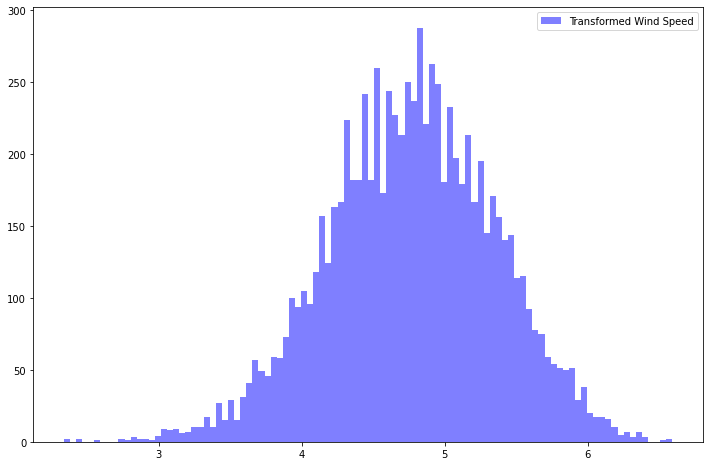

Benth parameters:
a_0 :  29.1  CI ~normally [2.87e+01,2.94e+01]
a_1 :  8.81e-05  CI ~normally [1.36e-05,1.63e-04]
a_2 :  2.35  CI ~normally [2.10e+00,2.61e+00]
a_3 :  1.56  CI ~normally [1.30e+00,1.81e+00]
Cabrera parameters:
a_0 :  29.1  CI ~normally [2.87e+01,2.94e+01]
a_1 :  8.81e-05  CI ~normally [1.36e-05,1.63e-04]
a_2 :  2.82  CI ~normally [2.57e+00,3.08e+00]
a_3 :  0.0263  CI ~normally [-2.29e-01,2.82e-01]
d_1 :  34.0  CI ~normally [2.87e+01,3.92e+01]
d_2 :  -2.15e+02  CI ~normally [-1.37e+03,9.43e+02]
Benth RSS: 7.74e+02
Cabrera RSS: 7.74e+02


<AxesSubplot:xlabel='time'>

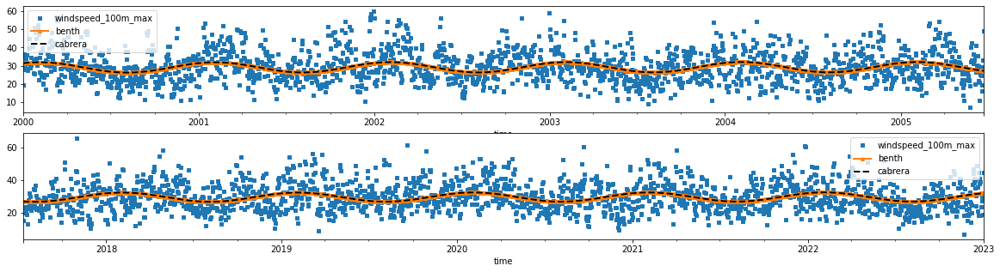

In [31]:
# --- Example: Fit the data to Vilnius --- #
example_df = weather_df[weather_df['city'] == 'Vilnius']
# Sort by time
example_df = example_df.sort_values(by='time')[['time','windspeed_100m_max']]
example_df = example_df.set_index('time')

# Convert the index to ordinal
if isinstance(example_df.index , pd.DatetimeIndex):
    first_ord = example_df.index.map(dt.datetime.toordinal)[0]
    example_df.index=example_df.index.map(dt.datetime.toordinal)
    
# Normal Wind Speed + Transformation in Histogram
example_df['windspeed_100m_max_transformed'] = transformation_wind_speed(example_df['windspeed_100m_max'], lambda_value = 1/5)

fig, ax = plt.subplots(figsize=(12,8))
#ax.hist(example_df['windspeed_100m_max'], bins=50, alpha=0.5, label='Normal', color='red')
ax.hist(example_df['windspeed_100m_max_transformed'], bins=100, alpha=0.5, label='Transformed Wind Speed', color='blue')
ax.legend(loc='upper right')
plt.show()

# Shift the index to start at 0
example_df.index = example_df.index - first_ord

# Fit the data
params_benth, cov_benth = curve_fit(seasonality_benth, example_df.index, example_df['windspeed_100m_max'], method = 'lm')
params_cabrera, cov_cabrera = curve_fit(seasonality_cabrera, example_df.index, example_df['windspeed_100m_max'], method = 'lm')
# Print the parameters
params_benth_names = ['a_0', 'a_1', 'a_2', 'a_3']
params_cabrera_names = ['a_0', 'a_1', 'a_2', 'a_3', 'd_1', 'd_2']

print('Benth parameters:')
std_dev = np.sqrt(np.diag(cov_benth))
for name, p, sd in zip( params_benth_names, params_benth, std_dev):
    print('{0} :  {1:0.3}  CI ~normally [{2:0.2e},{3:0.2e}]'.format(name, p, p-1.96*sd,p+1.96*sd))

print('Cabrera parameters:')
std_dev = np.sqrt(np.diag(cov_cabrera))
for name, p, sd in zip( params_cabrera_names, params_cabrera, std_dev):
    print('{0} :  {1:0.3}  CI ~normally [{2:0.2e},{3:0.2e}]'.format(name, p, p-1.96*sd,p+1.96*sd))

print('Benth RSS: {0:0.3}'.format(RSS(example_df['windspeed_100m_max'], seasonality_benth(example_df.index, *params_benth))))
print('Cabrera RSS: {0:0.3}'.format(RSS(example_df['windspeed_100m_max'], seasonality_cabrera(example_df.index, *params_cabrera))))

example_df['benth'] = seasonality_benth(example_df.index, *params_benth)
example_df['cabrera'] = seasonality_cabrera(example_df.index, *params_cabrera)   
# Convert the index back to datetime
example_df['time'] = (example_df.index + first_ord).map(dt.datetime.fromordinal)

# Plot first and last years of the data (2 subplots)
fig, axes = plt.subplots(2, 1, figsize=(20, 5), sharex=False)
example_df[:2000].plot(ax=axes[0], x='time', y=['windspeed_100m_max', 'benth', 'cabrera'], style=['s','^-','k--'] , markersize=4, linewidth=2 )
example_df[-2000:].plot(ax=axes[1], x='time', y=['windspeed_100m_max', 'benth', 'cabrera'], style=['s','^-','k--'] , markersize=4, linewidth=2 )

# --- Example: Fit the data to Vilnius --- #

Fourier Series Parameters:
a0 50.128737041
a1 12.530092227
a2 -4.462822357
a3 -0.839964575
a4 1.790240834
b1 3.896736601
b2 -0.098307642
b3 0.638035034
b4 -0.659792697


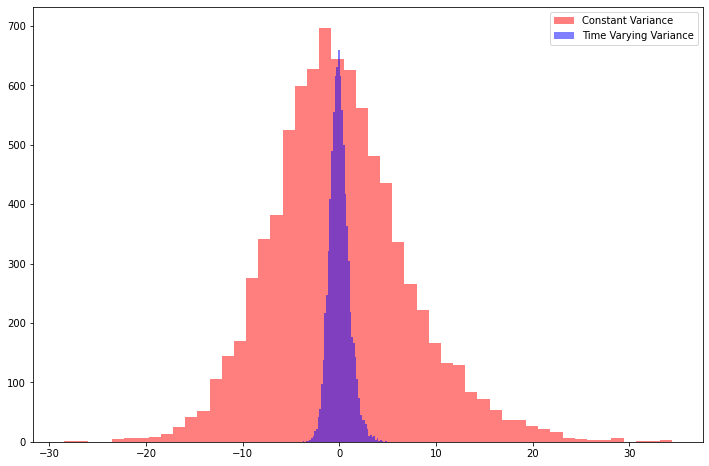

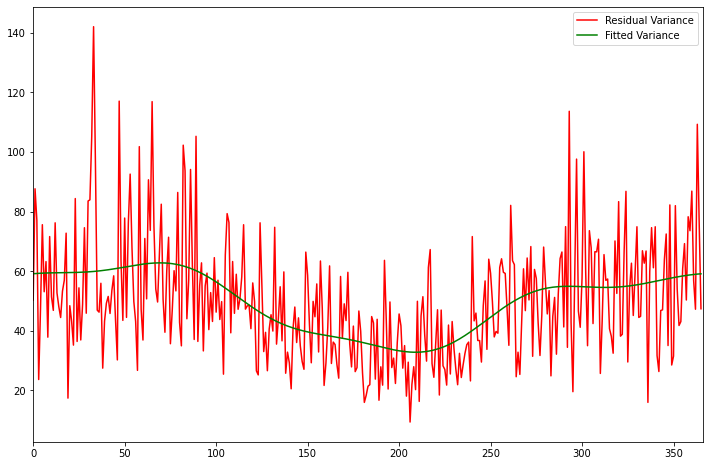

In [32]:
example_result = autoregressive_time_varying_variance_fit(example_df, seasonality_benth, variable = 'windspeed_100m_max', max_ar_lag=3, fourier_order = 4)

print("Fourier Series Parameters:")
for i,v in example_result['fourier_model'].params.items():
    print(round(v,9))

# Plot the histogram of the residuals (both constant and time varying variance) overlayed on each other
fig, ax = plt.subplots(figsize=(12,8))
ax.hist(example_result['result']['residuals_cv'], bins=50, alpha=0.5, label='Constant Variance', color='red')
ax.hist(example_result['result']['residuals_tv'], bins=50, alpha=0.5, label='Time Varying Variance', color='blue')
ax.legend(loc='upper right')
plt.show()

example_df = example_result['result']
# Plot the volatility captured by the fourier series and the actual volatility by day (lineplot)
example_df['day'] = example_df['time'].dt.dayofyear
example_summary_df = example_df.groupby('day').agg({'residuals_cv' : 'var', 'fitted_variance' : 'mean'}).reset_index()

fig, ax = plt.subplots(figsize=(12,8))
ax.plot(example_summary_df['residuals_cv'], label='Residual Variance', color='red')
ax.plot(example_summary_df['fitted_variance'], label='Fitted Variance', color='green')
ax.legend(loc='upper right')
plt.xlim(0,366)
plt.show()

#### 3.2: Continious-Time Autoregressive Models

Let $\mathcal{B}$ be a Brownian motion which is defined on a *complete filtered probability space* $(\Omega, \mathcal{F}, \{\mathcal{F}\}_{t \geq 0}, P)$. Additionally, we introduce a stochastic process $\mathbf{X}(t)$ defined in $\mathbf{R}^{p}$ for $p \geq 1$ as the solution of the stochastic differential equation (SDE):

\begin{equation}
    d \mathbf{X}(t)=A \mathbf{X}(t) dt + \textbf{e}_{p} \sigma(t) d \mathcal{B}(t)
\end{equation}

where $\textbf{e}_{p}$ the p-th Euclidean unit vector. The  ($p \times p$) matrix $A$ is defined as:

A = $\begin{bmatrix}
    0  & 1 & 0 & \cdots & 0 \\
    0  & 0 & 1 & \cdots & 0 \\
    \vdots & \vdots & \vdots & \vdots & \vdots \\
    0 & 0 & 0 & \cdots & 1 \\
    -a_{p} & -a_{p-1} & -a_{p-2}& \cdots & -a_{1} \\
\end{bmatrix}$

The constants $a_{k},k=1,...,p$ are assumed to be *non-negative* ($\alpha_{p} > 0$). In order to model and account for a seasonal volatility pattern, we consider a bounded and continuous function for $\sigma(t)$ that is strictly bounded away from zero.

The solution of Equation \ref{eq:sde_car} starting at time $t \geq 0$ is given by the stochastic process $\mathbf{X}(s),s \geq t$ below, the full derivation can be found in \cite{benth_book2012}:

\begin{equation}
    \mathbf{X}(s)=\exp (A (s-t))\mathbf{X}(t) + \int_{t}^{s} \exp (A (s-u)) \textbf{e}_{p} \sigma(u) d \mathcal{B}(u)
\end{equation}

For $0 \leq q < p$, define the vector $b \in \mathbf{R}^{p}$ with coefficients $b_{j},j=0,1,...,p-1$ satisfying $b_{q}=1$ and $b_{j}=0$ for $q < j < p$. We can now define the CARMA(p,q) process as:

\begin{equation}
    {Y}(t)=b'\mathbf{X}(t)
\end{equation}

The CAR(p) process, which is the standard workhorse of modeling weather parameters, is a special case of the CARMA(p,q) process when $q=0$ and therefore $b=\textbf{e}_{1}$.

Below are the relations that link the CARMA model to the discrete-time ARMA. This will enable us to identify the parameters of a CARMA process, from the estimates obtained from an ARMA process.

We focus on the CAR models only, that is, on the process $Y(t)=X_{1}(t)$ (where $q=0$). The derivations and relations which yield a link between continuous-time $AR(p)$ and the discrete-time counterpart in Benth (2012) result in the following equalities:

\begin{equation}
    \frac{1}{\Delta^{p-1}}\sum^{p}_{k=0}(-1)^{k}b^{p}_{k}x_{1}(t+(p-k)\Delta) = -\sum^{p}_{i=1}a_{p-i+1} \frac{1}{\Delta^{i-2}} \sum^{i-2}_{k=0}(-1)^kb_{k}^{i-1}x_{1}(t+(i-1-k)\Delta) + \sigma(t)\sqrt{\Delta}\varepsilon(t),
\end{equation}

where the coefficients $b_{k}^{i}$ are defined as $b_{0}^{i}=b^{i}_{i}=1$ for $i=0,...,p$. Using an $AR(p)$ time series model for $x_{1}(t)$, we can estimate the coefficients and use above Equation to find the corresponding parameters $a_{1},...,a_{p}$ in the CAR($p$) dynamics.

In [31]:
# p = 1
# phi_1 = 1 - a_1

# p = 2
# phi_1 - 2 = - a_1
# phi_2 + 1 = a_1 - a_2 

# p = 3
# phi_1 - 3 =  -a_1
# phi_2 + 3 = 2*a_1 - a_2
# phi_3 - 1 = a_2 - a_1 - a_3

# p = 4
# phi_1 - 4 = -a_1
# phi_2 + 6 = 3*a_1 - a_2
# phi_3 - 4 = 2*a_2 - a_3 - 3*a_1
# phi_4 + 1 = a_3 - a_4 - a_2 + a_1
    
def ar_car_link(phi):
    """
    Returns a AR-CAR link between the AR(p) and CAR(p) models for p=1,2,3,4
    """
    # AR(p) model
    # phi = [phi_1, phi_2, phi_3, phi_4, ..., phi_p]
    p = len(phi)
    if p==1:
        x = [1 - phi[0]]
    elif p==2:
        A = np.array([[-1,0],[1,-1]])
        b = np.array([phi[0]-2,phi[1]+1])
        x = np.linalg.solve(A, b)
    elif p==3:
        A = np.array([[-1,0,0],[2,-1,0],[-1,1,-1]])
        b = np.array([phi[0]-3,phi[1] + 3,phi[2] -1])
        x = np.linalg.solve(A, b)
    elif p==4:
        A = np.array([[1,0,0,0],[3,-1,0,0],[-3,2,-1,0],[1,-1,1,-1]])
        b = np.array([-phi[0]+4,phi[1]+6,phi[2]-4,phi[3]+1])
        x = np.linalg.solve(A, b)
    else:
        raise ValueError('Only p=1,2,3,4 supported')
        
    # CAR(p) model
    A = np.zeros((p,p))
    for i in range(p):
        if i>0:
            A[i-1,i] = 1
        A[p-1,i] = -x[len(x)-i-1]
        
    return A, x

from scipy.linalg import expm
# Recursive Euler Scheme, see https://en.wikipedia.org/wiki/Euler%E2%80%93Maruyama_method
class EulerSchemeCAR:
    def __init__(self, A, seasonality_mean_func, seasonality_mean_params, variance_func, variance_func_params, dt = 1):
        self.A = A
        self._ = expm(A*dt)
        
        self.variance_func = variance_func
        self.variance_func_params = variance_func_params
        self.seasonality_mean_func = seasonality_mean_func
        self.seasonality_mean_params = seasonality_mean_params
        
        self.variance = None
        self.mean = None
        
        self.dt = dt
        self.p = A.shape[0]
        # Euclidean unit vector
        e = np.zeros(self.p)
        e[-1] = 1
        self.e = e.reshape(self.p,1)
    
    
    
    """
    Simulate the CAR(p) model using the Euler Scheme
    
    x0: initial value
    t0: start time (in days)
    t1: end time (in days)
    nsim: number of simulations
    """
    
    def simulate(self, x0, t0, t1, nsim = 100):
        # Calculate the number of steps
        n_steps = int((t1-t0)/self.dt)
        # Calculate the time points
        time_points = np.linspace(t0, t1, n_steps)
        # Calculate the variance at time t (Fourier Series)
        variance = self.variance_func.model(x=time_points, **self.variance_func_params).y
        # Calculate the mean at time t (Custom Function)
        mean = self.seasonality_mean_func(time_points, *self.seasonality_mean_params)
        
        # Create a 3D array for xs_sim (nsim x self.p x n_steps)
        xs_sim = np.zeros((nsim, self.p, n_steps))
        
        # TODO: Vectorize this loop to
        for s in range(nsim):
            # Euler Scheme Approximation        
            xs = np.zeros((n_steps, self.p))
            # Fill the first value with the initial value (px1)
            xs[0] = np.full(self.p, x0)
            for i in range(1, n_steps):
                xs[i] = self.euler_step(xs[i-1], variance[i])
                
            xs_sim[s] = xs.transpose()
            
        # xs is the simulated CAR(p) model (px1)
        # ys is the simulated transformed using Y(t) = b'X(t)
        # ms is Y(t) + mean
        b = np.zeros(self.p).reshape(1,self.p)
        b[0] = 1
        ys_sim = np.dot(b, xs_sim)
        ms_sim = ys_sim + mean
        return xs_sim.transpose(), ys_sim.transpose()[:,:,0], ms_sim.transpose()[:,:,0]
        
    def euler_step(self, x, v):
        # Calculate the next step
        # p i.i.d. standard normal random variables (px1) TODO: This is weird, I think it should be 1x1 or a cross product or something
        epsilon = np.array(np.random.normal(0,1, size = 1))
        x = np.matmul(self._, x) + np.matmul(self._,self.e).dot(epsilon *np.sqrt(v)*np.sqrt(self.dt))
        # Returns a (px1) vector
        return x


In [34]:
# Example on page 102 of Benth (2012)
A, x = ar_car_link([0.46, -0.05, 0.05, 0.02])
# Check if the real parts of the eigenvalues of A are all negative (i.e. A is stable)
print(np.linalg.eig(A)[0].real)
# Visualize A matrix for human readability
pd.DataFrame(A)

[-1.2163098  -0.96413926 -0.96413926 -0.39541167]


,0,1,2,3
0,0.00,1.00,0.00,0.00
1,0.00,0.00,1.00,0.00
2,0.00,0.00,0.00,1.00
3,-0.52,-2.67,-4.67,-3.54


In [77]:
# --- Example: Fit the data to Vilnius --- #
example_df = weather_df[weather_df['city'] == 'Vilnius'][200:]
# Sort by time
example_df = example_df.sort_values(by='time')[['time','temperature_2m_avg']]
example_df = example_df.set_index('time')

# Convert the index to ordinal
if isinstance(example_df.index , pd.DatetimeIndex):
    first_ord = example_df.index.map(dt.datetime.toordinal)[0]
    # The index needs to correspond to the day of the year, so if toordinal is 7800, but the day of the year is 200, we need to subtract 7600
    first_day = dt.datetime.fromordinal(first_ord).timetuple().tm_yday
    example_df.index=example_df.index.map(dt.datetime.toordinal)

# Shift the index to start at 0
example_df.index = example_df.index - first_ord + (first_day - 1)
example_result = autoregressive_time_varying_variance_fit(example_df, seasonality_cabrera, variable = 'temperature_2m_avg', max_ar_lag=3, fourier_order = 4)

ar_model = example_result['ar_model']

A, x = ar_car_link(ar_model.params)

variance_func = example_result['fourier_model']
variance_func_params = example_result['fourier_model'].params

mean_func = seasonality_cabrera
mean_func_params = example_result['seasonality_function'][0]
#print(mean_func_params)
example_CAR = EulerSchemeCAR(A, 
                             seasonality_mean_func=mean_func, 
                             seasonality_mean_params=mean_func_params, 
                             variance_func=variance_func, 
                             variance_func_params=variance_func_params)

# Simulate the CAR(p) model
T0 = 100
T1 = 365*3
xs, ys, ms = example_CAR.simulate(x0=1, t0=T0, t1=T1, nsim = 500)


Int64Index([ 200,  201,  202,  203,  204,  205,  206,  207,  208,  209,
            ...
            8392, 8393, 8394, 8395, 8396, 8397, 8398, 8399, 8400, 8401],
           dtype='int64', name='time', length=8202)


In [36]:
ms_df = pd.DataFrame(ms)
# Join with original data
ms_df.index = ms_df.index + T0
ms_df.head(5)

,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
100,5.614460,5.614460,5.614460,5.614460,5.614460,5.614460,5.614460,5.614460,5.614460,5.614460,...,5.614460,5.614460,5.614460,5.614460,5.614460,5.614460,5.614460,5.614460,5.614460,5.614460
101,6.214986,3.010208,5.060883,5.602148,4.962073,3.471007,3.596948,3.892930,7.566735,3.082670,...,5.684239,4.199043,6.268332,7.738136,3.047493,6.512179,5.413335,6.378978,5.996130,7.475405
102,4.763795,4.587636,5.786344,5.707913,6.492367,6.172189,3.033106,2.915112,10.176550,5.040760,...,5.756613,3.320621,6.420246,8.816528,5.471630,6.456086,5.328856,7.932328,6.661277,8.238781
103,5.215085,4.196249,6.939204,4.377380,6.972745,6.739847,4.031283,4.784985,6.566094,6.626803,...,4.116641,3.396211,7.432310,7.217281,5.568848,7.260061,2.307831,9.197800,6.512877,9.088938
104,5.580471,5.271733,6.246398,2.465901,8.892268,5.452389,5.937321,3.842259,7.543218,6.560140,...,5.758742,2.482211,8.579783,5.883005,4.688220,8.369062,2.840793,10.943771,5.633466,9.909255


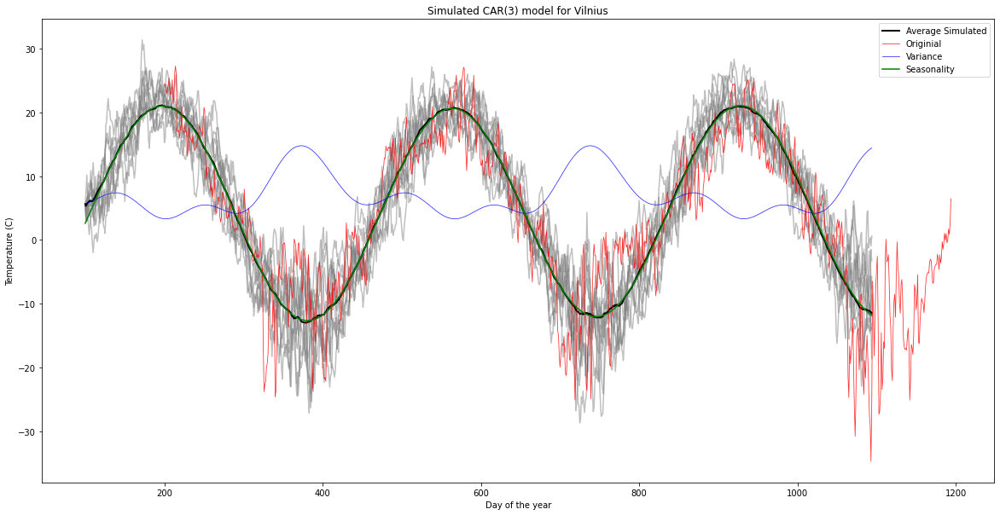

In [78]:
# --- Example: Plot a few simulation runs for the data in Vilnius --- #
# Plot the simulated data (only the first 10 simulations for clarity) and the average
fig, ax = plt.subplots(figsize=(20,10))
ax.plot(ms_df.iloc[:,:10], color='grey', alpha=0.5)
ax.plot(ms_df.mean(axis=1), color='black', linewidth=2, label='Average Simulated')
# Actual data
#example_df[:len(ms_df)].plot(ax=ax, color='red', alpha=0.5, linewidth=2)
ax.plot(example_df[0:len(ms_df)]['temperature_2m_avg'], color='red', alpha = 0.8, linewidth = 0.8, label='Originial')
# Fourrier series
fourier = pd.DataFrame(variance_func.model(x=ms_df.index, **variance_func_params).y)
fourier.index = fourier.index + T0
# Mean 
benth = pd.DataFrame(seasonality_cabrera(ms_df.index, *mean_func_params))
benth.index = benth.index + T0
ax.plot(fourier, color='blue', alpha = 0.8, linewidth = 0.8, label='Variance')
ax.plot(benth, color='green', alpha = 1, linewidth = 1.5, label='Seasonality')
ax.set_xlabel('Day of the year')
ax.set_ylabel('Temperature (C)')
ax.set_title('Simulated CAR(3) model for Vilnius')
# Legend
ax.legend()

plt.show()


#### 3.3: Pricing & Change Of Measure

In this section, different methodologies for pricing weather contracts based on temperature and wind speed are presented and discussed. Consider a forward contract at time $t$, the arbitrage-free price of the forward contract will be:

\begin{equation}
f(t,T)=S(t)\exp (r(T-t)),
\end{equation}

where $r$ is a constant compounding interest rate, $T$ is the delivery date of the forward, and $S(t)$ is the current spot price. From the general arbitrage pricing theory, we know that a market is free of arbitrage as long as there exists at least one equivalent martingale measure $\mathcal{Q}$.

To derive the explicit price, a specification is needed for the risk-neutral probability measure $\mathcal{Q}$. However, the weather derivatives market is an incomplete market, as weather parameters themselves cannot be stored or traded. Because of this incompleteness, any probability measure $\mathcal{Q}$ is equivalent to the real measure $\mathcal{P}$ in a risk-neutral measure, yielding a *zero risk premium*.

---

We introduce a class of equivalent probabilities $\mathcal{Q}$ to be used as the pricing measures in the pricing of weather forwards. The measures change the level of mean reversion in the CARMA dynamics $\mathbf{X}(t)$ from zero to a constant and in addition change the AR coefficients $a_{1},a_{2},...,a_{p}$. The latter may be interpreted as a change in the speed of mean reversion of the stationary CARMA dynamics. In the book of Benth (2012) precise derivations are given that lead to the following result.

The $\mathcal{Q}^{\theta}$ dynamics of $\mathbf{X}(t)$  is

\begin{equation}
d \mathbf{X}(t) = (e_{p} \theta_{0}(t) + A_{\theta}\mathbf{X}) dt + e_{p} \sigma(t)d \mathcal{\tilde{B}}(t),
\end{equation}

where the measure change $\mathcal{\tilde{B}}(t)$ is defined as
\begin{equation}
d \mathcal{\tilde{B}}(t)= \frac{\theta_{0}(t)}{\sigma(t)} dt + d \mathcal{B}(t)
\end{equation}

and $A_{\theta}$ is 

$A_{\theta}$ = $\begin{bmatrix}
    0  & 1 & 0 & \cdots & 0 \\
    0  & 0 & 1 & \cdots & 0 \\
    \vdots & \vdots & \vdots & \vdots & \vdots \\
    0 & 0 & 0 & \cdots & 1 \\
    -(a_{p} - \theta_{p}) & -(a_{p-1} - \theta_{p-1}) & -(a_{p-2} - \theta_{p-2})& \cdots & -(a_{1} - \theta_{1}) \\
\end{bmatrix}$

Very difficult, for now we assume $\theta$=0

##### 3.3.1: Temperature Derivatives

The following equations represent the calculations for various weather indices:
\begin{equation}
HDD(\tau_{1},\tau_{2}) = \int_{\tau_{1}}^{\tau_{2}} \max(c - T_{u}, 0) du,
\end{equation}

\begin{equation}
CDD(\tau_{1},\tau_{2}) = \int_{\tau_{1}}^{\tau_{2}} \max(T_{u}-c, 0) du,
\end{equation}

\begin{equation}
CAT(\tau_{1},\tau_{2}) = \int_{\tau_{1}}^{\tau_{2}} T_{u} du,
\end{equation}
where c is a baseline temperature, which is usually $18^{\circ}C$ or $65^{\circ}F$, and $T_{u}=\frac{T_{u,\max} + T_{u, \min}}{2}$ is the average daily temperature on day u. The CDD index is intended to measure the demand for air-conditioning, whereas the HDD measures the demand for heating. The typical seasons of these contracts correspond to when heating demands or cooling demands are high, thus the HDD index usually measures the temperature from October to April whereas the CDD index measures the temperature from April to October. The CAT index substitutes the CDD index for the European cities traded on the CME. 

A HDD-CDD parity can be deduced from the previous expressions which can be expressed as:
\begin{equation}
CDD(\tau_{1},\tau_{2})- HDD(\tau_{1},\tau_{2})= CAT(\tau_{1},\tau_{2}) - c(\tau_{2}-\tau_{1}).
\end{equation}

In [37]:
### Using simulations to compute the weather derivatives

# HDD(\tau_{1},\tau_{2}) = \int_{\tau_{1}}^{\tau_{2}} \max(c - T_{u}, 0) du,
def HDD(x, t0, t1 , c = 18.0, y = []):
    # x is a vector of (simulated) temperatures, if its a matrix return a vector of columns
    # y is a vector of actual temperatures
    # c is the baseline temperature
    _x = x[t0:t1].copy()
    _y = y[t0:t1].copy()

    # Replace the simulated temperatures with the actual temperatures (if available)
    if len(_y) > 0:
        # Fill a matrix of the same size as x with the values of y
        _x[:len(_y)] = np.tile(_y, (_x.shape[1], 1)).T
        
    return np.sum(np.maximum(c - _x, 0), axis = 0)
    
# CDD(\tau_{1},\tau_{2}) = \int_{\tau_{1}}^{\tau_{2}} \max(T_{u}-c, 0) du,
def CDD(x, t0, t1 , c = 18.0, y = []):
    # x is a vector of (simulated) temperatures, if its a matrix return a vector of columns
    # y is a vector of actual temperatures
    # c is the baseline temperature
    _x = x[t0:t1].copy()
    _y = y[t0:t1].copy()

    # Replace the simulated temperatures with the actual temperatures (if available)
    if len(_y) > 0:
        # Fill a matrix of the same size as x with the values of y
        _x[:len(_y)] = np.tile(_y, (_x.shape[1], 1)).T
        
    return np.sum(np.maximum(_x - c, 0), axis = 0)

# CAT(\tau_{1},\tau_{2}) = \int_{\tau_{1}}^{\tau_{2}} T_{u} du,
def CAT(x, t0, t1, y = []):
    # x is a vector of (simulated) temperatures, if its a matrix return a vector of columns
    # y is a vector of actual temperatures
    # c is the baseline temperature
    _x = x[t0:t1].copy()
    _y = y[t0:t1].copy()

    # Replace the simulated temperatures with the actual temperatures (if available)
    if len(_y) > 0:
        # Fill a matrix of the same size as x with the values of y
        _x[:len(_y)] = np.tile(_y, (_x.shape[1], 1)).T
        
    return np.sum(_x, axis = 0)

In [88]:
# --- Example: Compute HDD,CDD and CAT for the simulations in Vilnius --- #
example_df = weather_df[weather_df['city'] == 'Vilnius'][200:]
# Sort by time
example_df = example_df.sort_values(by='time')[['time','temperature_2m_avg']]
example_df = example_df.set_index('time')
# Keep the old date column
example_df['date'] = example_df.index
# Convert the index to ordinal
if isinstance(example_df.index , pd.DatetimeIndex):
    first_ord = example_df.index.map(dt.datetime.toordinal)[0]
    # The index needs to correspond to the day of the year, so if toordinal is 7800, but the day of the year is 200, we need to subtract 7600
    first_day = dt.datetime.fromordinal(first_ord).timetuple().tm_yday
    example_df.index=example_df.index.map(dt.datetime.toordinal)

# Shift the index to start at 0
example_df.index = example_df.index - first_ord + (first_day - 1)

example_result = autoregressive_time_varying_variance_fit(example_df, seasonality_cabrera, variable = 'temperature_2m_avg', max_ar_lag=3, fourier_order = 4)

ar_model = example_result['ar_model']

A, x = ar_car_link(ar_model.params)

variance_func = example_result['fourier_model']
variance_func_params = example_result['fourier_model'].params

mean_func = seasonality_cabrera
mean_func_params = example_result['seasonality_function'][0]
#print(mean_func_params)
example_CAR = EulerSchemeCAR(A, 
                             seasonality_mean_func=mean_func, 
                             seasonality_mean_params=mean_func_params, 
                             variance_func=variance_func, 
                             variance_func_params=variance_func_params)

# Simulate the CAR(p) model
T0 = 100
T1 = 365*3
xs, ys, ms = example_CAR.simulate(x0=1, t0=T0, t1=T1, nsim = 100)

pd.DataFrame(ms).head(5)

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,5.614460,5.614460,5.614460,5.614460,5.614460,5.614460,5.614460,5.614460,5.614460,5.614460,...,5.614460,5.614460,5.614460,5.614460,5.614460,5.614460,5.614460,5.614460,5.614460,5.614460
1,4.637816,4.091227,6.042925,6.448259,5.057310,5.384996,4.231775,2.275979,4.213679,5.002749,...,4.884391,5.611176,3.019403,4.540806,4.479877,5.007163,6.026280,3.455711,6.801688,5.014822
2,4.023787,3.523226,4.274845,6.997438,4.356837,6.475169,5.283565,3.978943,1.179383,3.082947,...,4.819262,5.042575,-0.300693,4.602836,2.881305,3.727128,3.795918,5.866587,6.377473,7.859741
3,2.707439,5.305248,1.076812,7.681128,5.564071,4.551327,7.581454,5.221317,0.958897,4.214958,...,4.961036,5.028941,1.194820,6.608006,3.101220,5.325204,3.678830,6.330177,7.229946,6.624379
4,1.377719,5.034075,0.809701,6.673750,4.606257,4.788089,8.275566,1.918547,0.450057,3.264953,...,4.547561,5.457024,-0.073865,6.896990,3.705098,4.463454,3.672080,6.548076,4.938284,4.391105


In [64]:
# Check if arbitrage relationship holds, if it does then the derivatives are correct
np.mean(CDD(ms, 150-T0, 180-T0) - HDD(ms, 150-T0, 180-T0) - CAT(ms, 150-T0, 180-T0))/18

-30.0

Text(0.5, 1.0, 'Histogram of CAT results')

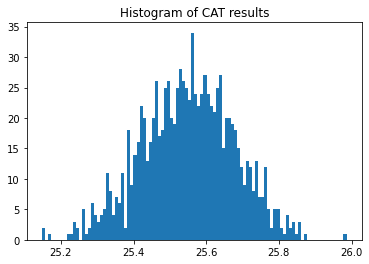

In [71]:
# Notice, that it's possible to add actual temperatures to the CAT, HDD and CDD functions so the index gets updated...
cat = CAT(x=ms,y=[26 for r in range(1,149)],t0=200-T0,t1=250-T0)/50
plt.hist(cat, bins = 100)
plt.title('Histogram of CAT results')

In [ ]:
### Analytical pricing of the derivatives

#mean = seasonality_mean_func(time_points, *seasonality_mean_params)

# Notice, this is without the seasonal component
def m(t, s, x, A):
    p = A.shape[0]
    
    # b vector
    b = np.zeros(p).reshape(1,p)
    b[0] = 1
    # Euclidean unit vector
    e = np.zeros(p)
    e[-1] = 1
        
    expm(A * (s - t))
    # Create a vector u to replicate the integral
    # Create the vector theta, which is the risk premium (0.001)
    theta = np.ones(s - t + 1) * 0.001
    integral = 0
    for u in range(t, s):
        integral =+ np.dot(
            np.dot(b, expm(A * (s - u))),
            np.dot(e, theta[u - t])   
        )
    return np.dot(np.dot(b, expm(A * (s - t))), x) + integral

def C(u,v, A):
    # A inverse
    return np.dot(np.linalg.inv(A) , ( expm(A * u) - expm(A * v)))

m(100, 150, xs[-1,:,-1], A)
C(100, 150, A)


def CAT_analytical(x, t0, t1, A):
    
    pass


array([[-1.9767504053351064e-08, -3.6265075743901367e-08,
        -2.1048229642788890e-08],
       [ 3.9037030782029350e-09,  7.1616572041997984e-09,
         4.1566218287102428e-09],
       [-7.7090651817459601e-10, -1.4142899982524415e-09,
        -8.2085312257269875e-10]])

##### 3.3.3: Actual Indices

The typical seasons of these contracts correspond to when heating demands or cooling demands are high, thus the HDD index usually measures the temperature from October to April whereas the CDD index measures the temperature from April to October. The CAT index substitutes the CDD index for the European cities traded on the CME. 

We are going to create monthly HDD, CAT running from:
- OCT, NOV, DEC, JAN, FEB, MAR: HDD
- APR, MAY, JUN, JUL, AUG, SEP, OCT: CAT

We are also going to make 3 and 6 month strips, HDD OCT-JAN, JAN-APR, OCT-APR and CAT APR-JUL, JUL-OCT, APR-OCT

In [35]:

def actual_indices(car, ar_fit, start_date = dt.date(2016,1,1), nsim = 100):
    df_actual = ar_fit['result'] # The dataframe with the actual temperatures
    end_date = df_actual['date'].max()

    # Get the idx of the start date in df_actual
    start_idx = df_actual[df_actual['date'] == start_date].index[0]
    end_idx = df_actual[df_actual['date'] == end_date].index[0]
    # Simulate the CAR(p) model
    xs, ys, ms = car.simulate(x0=1, t0=start_idx, t1=end_idx, nsim = nsim)
    
    # Strip - Monthly
    df_actual['year'] = df_actual['date'].dt.year
    df_actual['month'] = df_actual['date'].dt.month
    # Group by month, and for each date/day in the month we are going to run the CAT function using the same indices:
    # 1: Group by month
    # 2: For each month, get the index of the days in the month (e.g. 60,61,...,90)
    # 3: For each day in the month, run the CAT function using the ms[60:90] as in the example above
    # 4: For every day, add the actual temperature to the CAT function. So for day 62, it will become CAT(ms[60:90], df_actual['temperature_2m_avg'][60:62])
    # 5: Add the results to a list, and then add the list to a dataframe. This column will be called front month CAT    
    # Initialize an empty list to store the results
    results = []
    # For each month, calculate the CAR(p) values
    for (year, month), group in df_actual.groupby(['year', 'month']):
        indices = group.index
        for idx in indices:
            if idx < start_idx:
                continue
            ms_selected = ms[(indices[0]-start_idx):(indices[-1]-start_idx)]
            actual_selected = df_actual.loc[indices[0]:(idx-1), 'temperature_2m_avg']
            # Calculate the CAT function for each day of the month
            cat_value = CAT(x=ms_selected, y=actual_selected, t0 = 0, t1 = (indices[-1] - indices[0])).mean()
            cdd_value = CDD(x=ms_selected, y=actual_selected, t0 = 0, t1 = (indices[-1] - indices[0])).mean()
            hdd_value = HDD(x=ms_selected, y=actual_selected, t0 = 0, t1 = (indices[-1] - indices[0])).mean()
            
            #print(f"CAT from {indices[0]}-{indices[-1]} ({df_actual['date'][indices[0]]} - {df_actual['date'][indices[-1]]}) for {idx-1} is {cat_value}")
            
            _ = {
                'date' : group.loc[idx, 'date'],
                f'monthly_strip_CAT_{month}' : cat_value,
                f'monthly_strip_CDD_{month}' : cdd_value,
                f'monthly_strip_HDD_{month}' : hdd_value,
                'monthly_strip_CAT_continious' : cat_value,
                'monthly_strip_CDD_continious' : cdd_value,
                'monthly_strip_HDD_continious' : hdd_value
            }
            
            # Store the result
            #results.append((group.loc[idx, 'date'], cat_value, cdd_value, hdd_value))
            results.append(_)

    # Convert the results to a DataFrame and rename the columns
    df_results = pd.DataFrame(results).bfill()
    df_results['date'] = pd.to_datetime(df_results['date'], format='%Y-%m-%d')

    return df_results

In [125]:
df_result = actual_indices(example_CAR, example_result, start_date = dt.datetime(2017,1,1), nsim = 100)
# Plot the derivatives
fig, ax = plt.subplots(1,1, figsize=(15,5))
ax.plot(df_result['date'], df_result['monthly_strip_CAT_1'], label='CAT (Jan)')
ax.plot(df_result['date'], df_result['monthly_strip_CAT_2'], label='CAT (Feb)')
ax.plot(df_result['date'], df_result['monthly_strip_CAT_3'], label='CAT (Mar)')
ax.plot(df_result['date'], df_result['monthly_strip_CAT_4'], label='CAT (Apr)')
ax.plot(df_result['date'], df_result['monthly_strip_CAT_5'], label='CAT (May)')
ax.plot(df_result['date'], df_result['monthly_strip_CAT_6'], label='CAT (Jun)')
ax.plot(df_result['date'], df_result['monthly_strip_CAT_7'], label='CAT (Jul)')
ax.plot(df_result['date'], df_result['monthly_strip_CAT_8'], label='CAT (Aug)')
ax.plot(df_result['date'], df_result['monthly_strip_CAT_9'], label='CAT (Sep)')
ax.plot(df_result['date'], df_result['monthly_strip_CAT_10'], label='CAT (Oct)')
ax.plot(df_result['date'], df_result['monthly_strip_CAT_11'], label='CAT (Nov)')
ax.plot(df_result['date'], df_result['monthly_strip_CAT_12'], label='CAT (Dec)')
ax.plot(df_result['date'], df_result['monthly_strip_CAT_continious'], label='CAT')
ax.legend()
ax.set_title('Monthly strip derivatives')
ax.set_xlabel('Date')
plt.show()

 

NameError: name 'example_CAR' is not defined

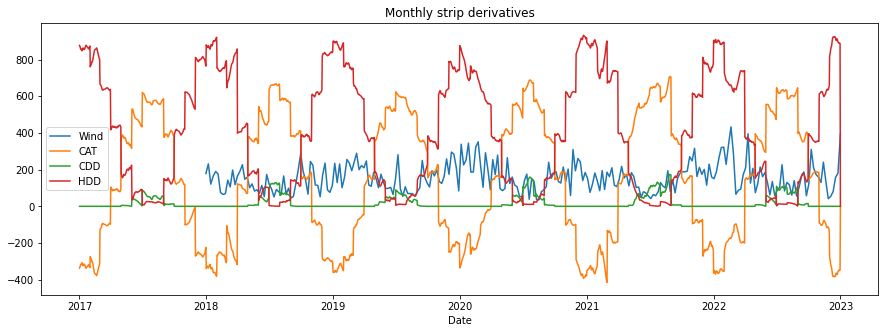

In [355]:
# Get hourly generation in LT
lt_df = hourly_entsoe_generation_production[hourly_entsoe_generation_production['country_code'] == 'LT']
# Resample weekly
lt_df = lt_df.resample('W', on='timestamp').mean().reset_index()
lt_df['date'] = lt_df['timestamp'].dt.date

# Plot the fossil fuel generation along with the temperature
fig, ax = plt.subplots(1,1, figsize=(15,5))
ax.plot(lt_df['date'], lt_df['wind_onshore'], label='Wind')
ax.plot(df_result['date'], df_result['monthly_strip_CAT_continious'], label='CAT')
ax.plot(df_result['date'], df_result['monthly_strip_CDD_continious'], label='CDD')
ax.plot(df_result['date'], df_result['monthly_strip_HDD_continious'], label='HDD')
ax.legend()
ax.set_title('Monthly strip derivatives')
ax.set_xlabel('Date')
plt.show()

In [356]:
# Correlation between lt_df and df_result
lt_df = hourly_entsoe_generation_production[hourly_entsoe_generation_production['country_code'] == 'LT']
lt_df_price = hourly_entsoe_day_ahead_prices[hourly_entsoe_day_ahead_prices['country_code'] == 'LT']
lt_df_price
# Resample weekly
lt_df = lt_df.resample('D', on='timestamp').mean().reset_index()
lt_df['date'] = pd.to_datetime(lt_df['timestamp'].dt.date)

lt_df_price = lt_df_price.resample('D', on='timestamp').mean().reset_index()
lt_df_price['date'] = pd.to_datetime(lt_df_price['timestamp'].dt.date)

merged_example = pd.merge(lt_df, df_result, on='date')
merged_example = pd.merge(merged_example, lt_df_price, on='date')
# Dropp all columns with na more than 10%
merged_example = merged_example.dropna(axis=1, thresh=0.9*len(merged_example))

# Compute correlation
corr = merged_example.drop(['date'], axis=1).corr()
corr.style.background_gradient(cmap='coolwarm')

,biomass,fossil_gas,hydro_pumped_storage,hydro_run_of_river_and_poundage,other,solar,waste,wind_onshore,monthly_strip_CAT_1,monthly_strip_CDD_1,monthly_strip_HDD_1,monthly_strip_CAT_continious,monthly_strip_CDD_continious,monthly_strip_HDD_continious,monthly_strip_CAT_7,monthly_strip_CDD_7,monthly_strip_HDD_7,monthly_strip_CAT_8,monthly_strip_CDD_8,monthly_strip_HDD_8,monthly_strip_CAT_9,monthly_strip_CDD_9,monthly_strip_HDD_9,monthly_strip_CAT_10,monthly_strip_CDD_10,monthly_strip_HDD_10,monthly_strip_CAT_11,monthly_strip_CDD_11,monthly_strip_HDD_11,monthly_strip_CAT_12,monthly_strip_CDD_12,monthly_strip_HDD_12,price,season
biomass,1.000000,-0.079470,-0.014793,0.326035,0.029361,-0.265332,-0.132825,0.242026,-0.212165,nan,0.227945,-0.662665,-0.362680,0.673213,0.014679,0.005562,-0.057438,0.001647,-0.054362,-0.103024,0.129616,0.123191,-0.114433,-0.079460,0.083922,0.079745,-0.032951,nan,0.032951,0.118228,nan,-0.118228,-0.222516,-0.464962
fossil_gas,-0.079470,1.000000,0.262348,-0.201480,-0.008176,-0.040370,-0.098396,-0.193922,-0.117173,nan,0.110129,0.120309,0.144615,-0.112759,0.083698,0.115989,0.140611,-0.046539,-0.007054,0.107005,-0.137474,-0.072558,0.133100,-0.062033,-0.180370,0.061582,-0.367007,nan,0.367007,-0.205744,nan,0.205744,0.061298,0.065211
hydro_pumped_storage,-0.014793,0.262348,1.000000,-0.003936,-0.023315,-0.085665,-0.098092,-0.082625,-0.089507,nan,0.090250,0.012372,-0.039531,-0.015157,-0.002925,0.005815,0.049905,-0.110036,-0.073035,0.150595,-0.035786,-0.043423,0.029694,-0.037982,-0.033241,0.037918,-0.084213,nan,0.084213,-0.058663,nan,0.058663,0.057172,0.062793
hydro_run_of_river_and_poundage,0.326035,-0.201480,-0.003936,1.000000,0.035796,0.049051,0.029404,0.083730,0.080653,nan,-0.080994,-0.415300,-0.302971,0.407018,-0.033692,-0.074798,-0.212728,0.103666,0.026475,-0.218799,0.183502,0.053873,-0.186342,-0.054276,0.092719,0.054568,0.287154,nan,-0.287154,0.106539,nan,-0.106539,-0.023970,-0.459766
other,0.029361,-0.008176,-0.023315,0.035796,1.000000,-0.041186,-0.046643,0.005367,-0.052036,nan,0.053840,-0.029276,-0.008571,0.031461,-0.007381,-0.009633,-0.009093,-0.007575,-0.007578,0.005734,-0.024709,-0.045455,0.017379,0.011031,0.001339,-0.011034,0.032412,nan,-0.032412,0.012240,nan,-0.012240,-0.049593,-0.029434
solar,-0.265332,-0.040370,-0.085665,0.049051,-0.041186,1.000000,0.464130,-0.162175,0.620415,nan,-0.634233,0.429326,0.338523,-0.424100,0.176738,0.185482,-0.033271,0.320663,0.306066,-0.269442,0.310836,0.324770,-0.268501,-0.229463,-0.185736,0.229113,0.070812,nan,-0.070812,-0.057224,nan,0.057224,0.569358,0.156035
waste,-0.132825,-0.098396,-0.098092,0.029404,-0.046643,0.464130,1.000000,0.021631,0.803703,nan,-0.809039,-0.050805,-0.026375,0.053936,0.143354,0.159798,0.024956,0.334529,0.286414,-0.340853,0.287515,0.356225,-0.237086,-0.091459,-0.179602,0.091030,-0.000832,nan,0.000832,-0.249787,nan,0.249787,0.639089,0.035897
wind_onshore,0.242026,-0.193922,-0.082625,0.083730,0.005367,-0.162175,0.021631,1.000000,0.037147,nan,-0.028032,-0.291974,-0.254814,0.281455,0.041407,0.033225,-0.064624,0.062541,0.023694,-0.117970,0.060129,0.080373,-0.048397,-0.028978,-0.044486,0.028876,-0.071262,nan,0.071262,-0.030186,nan,0.030186,-0.133541,-0.152151
monthly_strip_CAT_1,-0.212165,-0.117173,-0.089507,0.080653,-0.052036,0.620415,0.803703,0.037147,1.000000,nan,-0.995984,0.036571,0.001412,-0.042753,0.170281,0.172772,-0.065008,0.322314,0.287013,-0.308316,0.369552,0.480296,-0.300206,-0.174354,-0.194402,0.173942,0.026467,nan,-0.026467,-0.261094,nan,0.261094,0.699083,0.033820
monthly_strip_CDD_1,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan


#### 3.4: PPA
https://www.wbcsd.org/contentwbc/download/12227/182946/1

https://zeigo.com/blog/ppa-pricing-structure-easy/

https://www-sciencedirect-com.eur.idm.oclc.org/science/article/pii/S0140988322001542

In [12]:
def ppa_calc(p_fixed, p_dynamic, lamb, delta, phi, kappa = -np.inf, nu = np.inf):
    result = (p_fixed + phi) * lamb + (1 - lamb) * (1 - delta) * p_dynamic
    return np.where(result < kappa, kappa, np.where(result > nu, nu, result))

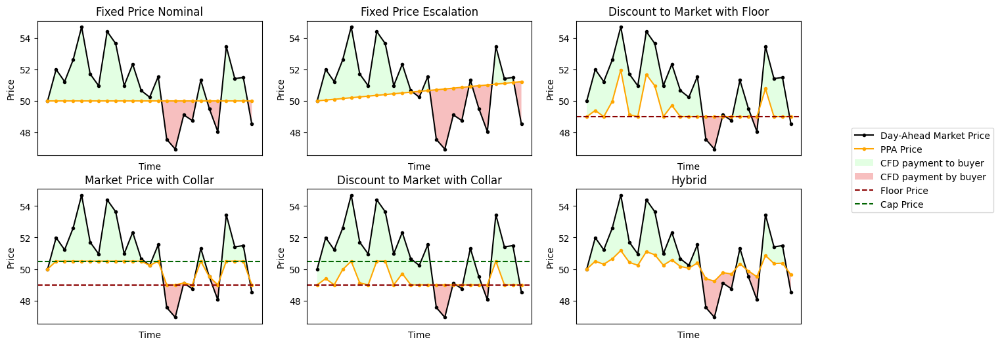

In [108]:
# Showcase the different PPA structures. Create a series of PPA prices for each PPA structure
# Set random seed
np.random.seed(42)
N_SIM = 25
P_FIXED = 50
# Create n_examples of p_dynamic under AR(2) process AutoReg(2) with intercept and trend
# The first value is 50
P_DYNAMIC = np.zeros(N_SIM)
P_DYNAMIC[0] = P_FIXED

for i in range(1, N_SIM):
    P_DYNAMIC[i] = 1 + 0.75 * P_FIXED + 0.25 * P_DYNAMIC[i - 1] + np.random.normal(0, 2)

# Create the example PPA structures
fixed_price_nominal = ppa_calc(p_fixed = P_FIXED, p_dynamic = P_DYNAMIC, lamb = 1, delta = 0, phi = 0)
# Increase the price by 0.1% each year
phi = P_FIXED * ((1.001 ** np.arange(N_SIM))-1)
fixed_price_escalation = ppa_calc(p_fixed = P_FIXED, p_dynamic = P_DYNAMIC, lamb = 1, delta = 0, phi = phi)

# Discount to market with floor
discount_price_floor = ppa_calc(p_fixed = P_FIXED, p_dynamic = P_DYNAMIC, lamb = 0, delta = 0.05, phi = 0, kappa = P_FIXED * 0.98)
# Discount to market with collar
price_collar = ppa_calc(p_fixed = P_FIXED, p_dynamic = P_DYNAMIC, lamb = 0, delta = 0, phi = 0, kappa = P_FIXED * 0.98, nu = P_FIXED * 1.01)
discount_price_collar = ppa_calc(p_fixed = P_FIXED, p_dynamic = P_DYNAMIC, lamb = 0, delta = 0.05, phi = 0, kappa = P_FIXED * 0.98, nu = P_FIXED * 1.01)

hybrid = ppa_calc(p_fixed = P_FIXED, p_dynamic = P_DYNAMIC, lamb = 0.75, delta = 0, phi = 0)


ppa_structures = {
    'Fixed Price Nominal' : {'func' : fixed_price_nominal, 'floor' : None, 'cap' : None},
    'Fixed Price Escalation' : {'func' : fixed_price_escalation, 'floor' : None, 'cap' : None},
    'Discount to Market with Floor' : {'func' : discount_price_floor, 'floor' : 0.98 * P_FIXED, 'cap' : None},
    'Market Price with Collar' : {'func' : price_collar, 'floor' : 0.98 * P_FIXED, 'cap' : 1.01 * P_FIXED},
    'Discount to Market with Collar' : {'func' : discount_price_collar, 'floor' : 0.98 * P_FIXED, 'cap' : 1.01 * P_FIXED},
    'Hybrid' : {'func' : hybrid, 'floor' : None, 'cap' : None}

}


# Create a plot that has the amount of ppa_structures as subplots
columns = 3
rows = len(ppa_structures) // columns
if len(ppa_structures) % columns: # Check if there are any remaining plots
    rows += 1
fig, ax = plt.subplots(rows, columns, figsize = (15, 3*rows), sharex = True) # Adjust figure size based on rows

# Make it compatible with one plot as well
if rows == 1 and columns == 1:
    ax = np.array([ax])
elif rows == 1:
    ax = np.array([ax])
elif columns == 1:
    ax = np.array([[ax_i] for ax_i in ax])

# Plot a ppa structure on each subplot 
for i, ppa_name in enumerate(ppa_structures):
    # Row
    r = i // columns
    # Column
    c = i % columns
    ppa = ppa_structures[ppa_name]
    ax[r,c].plot(P_DYNAMIC, color='black', label='Day-Ahead Market Price', marker = '.')
    ax[r,c].plot(ppa['func'], color='orange', label='PPA Price',  marker = '.')
    ax[r,c].fill_between(np.arange(0, N_SIM), P_DYNAMIC, ppa['func'], where=P_DYNAMIC >= ppa['func'], facecolor='#c9ffc9', interpolate=True,alpha = 0.5, label = 'CFD payment to buyer')
    ax[r,c].fill_between(np.arange(0, N_SIM), P_DYNAMIC, ppa['func'], where=P_DYNAMIC <= ppa['func'], facecolor='lightcoral', interpolate=True,alpha = 0.5, label = 'CFD payment by buyer')  
    
    # if it has a cap/floor plot it
    if ppa['floor'] is not None:
        ax[r,c].axhline(ppa['floor'], color = 'darkred', linestyle = '--', label = 'Floor Price')
    
    if ppa['cap'] is not None:
        ax[r,c].axhline(ppa['cap'], color = 'darkgreen', linestyle = '--', label = 'Cap Price')   
            
    ax[r,c].set_title(ppa_name)
    ax[r,c].set_xlabel('Time')
    ax[r,c].set_ylabel('Price')
    # Remove the xticks
    ax[r,c].set_xticks([])
    

# If there are any leftover subplot locations, remove them
for i in range(len(ppa_structures), rows * columns):
    fig.delaxes(ax.flatten()[i])

# Add extra space between the plots 
fig.subplots_adjust(hspace=0.25)
# Put legend outside of the plot area (only unique labels)
handles, labels = ax[1,1].get_legend_handles_labels()
fig.legend(handles, labels, loc='center right', bbox_to_anchor=(1.1, 0.5))



\begin{equation}
PPA(p_{\text{fixed}}, p_{\text{dynamic}}, \lambda, \delta, \phi, \kappa, \nu) = 
\begin{cases} 
\kappa & \text{if } p_{\text{fixed}}\lambda + \phi\lambda + (1 - \lambda)(1 - \delta)p_{\text{dynamic}} < \kappa \\
\nu & \text{if } p_{\text{fixed}}\lambda + \phi\lambda + (1 - \lambda)(1 - \delta)p_{\text{dynamic}} > \nu \\
p_{\text{fixed}}\lambda + \phi\lambda + (1 - \lambda)(1 - \delta)p_{\text{dynamic}} & \text{otherwise}
\end{cases}
\end{equation}

#### 3.4: Hedging



We define the power output of an asset $i$ as $\xi_{t,i}$ and the PPA price within the asset's country as $P_{t}$. We can compute the revenue of the asset within a given time period $(\tau_{1},\tau_{2})$ as $\pi_{i}(\tau_{1},\tau_{2})=\sum_{t=\tau_{1}}^{\tau_{2}} P_{t} \cdot \xi_{t,i}$. 

Like in multivariate continious-time modelling of of wind indexes and hedging wind risk, we obtain a payoff using the revenue and the weather derivatives.

This results in:

\begin{equation}
\pi_{i}(\tau_{1},\tau_{2}) + \sum_{j=1}^{L} \gamma_{j} W_{j}(\tau_{1},\tau_{2})
\end{equation}

where $\gamma_{j} W_{j}$ is the weighted weather derivate payoff.

#### 3.5: Media


In [294]:
# Temperature Dynamics Table

# For every city; the fitted parameters of the linear trend, seasonal component and AR(3) model

#weather_summary_df = weather_summary_df.melt(id_vars=['country', 'city', 'season'], var_name = ['variable', 'statistic'], value_name='value')
results_mean_temperature = []
results_variance_temperature = []

for city in weather_df['city'].unique():
    temp_df = weather_df[weather_df['city'] == city]
    country = temp_df['country'].unique()[0]
    
    # --- Fit the data --- #
    # Sort by time
    temp_df = temp_df.sort_values(by='time')[['time','temperature_2m_avg']]
    temp_df = temp_df.set_index('time')

    # Convert the index to ordinal
    if isinstance(temp_df.index , pd.DatetimeIndex):
        first_ord = temp_df.index.map(dt.datetime.toordinal)[0]
        # The index needs to correspond to the day of the year, so if toordinal is 7800, but the day of the year is 200, we need to subtract 7600
        first_day = dt.datetime.fromordinal(first_ord).timetuple().tm_yday
        temp_df.index=temp_df.index.map(dt.datetime.toordinal)

    # Shift the index to start at 0
    temp_df.index = temp_df.index - first_ord + (first_day - 1)

    temp_result = autoregressive_time_varying_variance_fit(temp_df, seasonality_cabrera, variable = 'temperature_2m_avg', max_ar_lag=3, fourier_order = 4)

    # Seasonal component
    # Fit the data
    (params_cabrera, cov_cabrera) = temp_result['seasonality_function']
    # Save the parameters
    params_cabrera_names = ['a_0', 'a_1', 'a_2', 'a_3', 'd_1', 'd_2']
    pararms_cabrera_list = zip(params_cabrera_names, params_cabrera)
    
    # Store the results in dictionary
    results_mean_temperature.append({'city' : city,'country' : country, **dict(pararms_cabrera_list), **dict(temp_result['ar_model'].params)})
    results_variance_temperature.append({'city' : city,'country' : country, **dict(temp_result['fourier_model'].params)})

In [298]:
# Pivot
table_mean = pd.DataFrame(results_mean_temperature)
table_mean = table_mean.set_index(['country', 'city'])

# Multiply by 10000
multiplier = 10**5
table_mean['a_1'] = table_mean['a_1'] * multiplier
# Change column name of a_1 to a_1 (10^5)
table_mean = table_mean.rename(columns={'a_1': 'a_1 (x 10^5)'})

# Create the MultiIndex for the columns
header = pd.MultiIndex.from_arrays([['Seasonal Component'] * 6 + ['Autoregressive Component'] * 3,
                                    table_mean.columns])

# Assign the new column index to the DataFrame
table_mean.columns = header
# Define the background gradients for each variable
table_mean = table_mean.style
table_mean = table_mean.format("{:.3f}")
# Convert to two tables that will be shown side by side
table_mean
#print(table_mean.to_latex(convert_css=True, clines= "skip-last;data", hrules = False, multicol_align = 'c', multirow_align='c'))


In [303]:
# Pivot
table_var = pd.DataFrame(results_variance_temperature)
table_var = table_var.set_index(['country', 'city'])
# Create the MultiIndex for the columns
header = pd.MultiIndex.from_arrays([['Fourier Coefficients'] * 9,
                                    table_var.columns])

# Assign the new column index to the DataFrame
table_var.columns = header

table_var = table_var.style
table_var = table_var.format("{:.3f}")
table_var
#print(table_var.to_latex(convert_css=True, clines= "skip-last;data", hrules = False, multicol_align = 'c', multirow_align='c'))


In [287]:
# Wind Dynamics Table

# For every city; the fitted parameters of the linear trend, seasonal component and AR(3) model

#weather_summary_df = weather_summary_df.melt(id_vars=['country', 'city', 'season'], var_name = ['variable', 'statistic'], value_name='value')
results_mean_wind = []
results_variance_wind = []

for city in weather_df['city'].unique():
    temp_df = weather_df[weather_df['city'] == city]
    country = temp_df['country'].unique()[0]
    
    # --- Fit the data --- #
    # Sort by time
    temp_df = temp_df.sort_values(by='time')[['time','windspeed_100m_max']]
    temp_df = temp_df.set_index('time')
    
    temp_df['windspeed_100m_max_transformed'] = transformation_wind_speed(temp_df['windspeed_100m_max'], lambda_value = 1/5)

    # Convert the index to ordinal
    if isinstance(temp_df.index , pd.DatetimeIndex):
        first_ord = temp_df.index.map(dt.datetime.toordinal)[0]
        # The index needs to correspond to the day of the year, so if toordinal is 7800, but the day of the year is 200, we need to subtract 7600
        first_day = dt.datetime.fromordinal(first_ord).timetuple().tm_yday
        temp_df.index=temp_df.index.map(dt.datetime.toordinal)

    # Shift the index to start at 0
    temp_df.index = temp_df.index - first_ord + (first_day - 1)

    temp_result = autoregressive_time_varying_variance_fit(temp_df, seasonality_cabrera, variable = 'windspeed_100m_max_transformed', max_ar_lag=4, fourier_order = 4)

    # Seasonal component
    # Fit the data
    (params_cabrera, cov_cabrera) = temp_result['seasonality_function']
    # Save the parameters
    params_cabrera_names = ['a_0', 'a_1', 'a_2', 'a_3', 'd_1', 'd_2']
    pararms_cabrera_list = zip(params_cabrera_names, params_cabrera)
    
    # Store the results in dictionary
    results_mean_wind.append({'city' : city,'country' : country, **dict(pararms_cabrera_list), **dict(temp_result['ar_model'].params)})
    results_variance_wind.append({'city' : city,'country' : country, **dict(temp_result['fourier_model'].params)})

In [304]:
# Pivot
table_mean = pd.DataFrame(results_mean_wind)
table_mean = table_mean.set_index(['country', 'city'])

# Multiply by 10000
multiplier = 10**5
table_mean['a_1'] = table_mean['a_1'] * multiplier
# Change column name of a_1 to a_1 (10^5)
table_mean = table_mean.rename(columns={'a_1': 'a_1 (x 10^5)'})

# Create the MultiIndex for the columns
header = pd.MultiIndex.from_arrays([['Seasonal Component'] * 6 + ['Autoregressive Component'] * 4,
                                    table_mean.columns])

# Assign the new column index to the DataFrame
table_mean.columns = header
# Define the background gradients for each variable
table_mean = table_mean.style
table_mean = table_mean.format("{:.3f}")
# Convert to two tables that will be shown side by side
table_mean
#print(table_mean.to_latex(convert_css=True, clines= "skip-last;data", hrules = False, multicol_align = 'c', multirow_align='c'))


In [305]:
# Correlation Analysis Table
min_date = pd.to_datetime(min(hourly_entsoe_day_ahead_prices['timestamp']), utc = True)
w_hourly['time'] = pd.to_datetime(w_hourly['time'], utc = True)
quadrant_df = (w_hourly[w_hourly['time'] >= min_date]).groupby(['country', 'time']).mean().reset_index().merge(
    hourly_entsoe_day_ahead_prices,
    left_on=['country', 'time'],
    right_on=['country_code', 'timestamp'],
).merge(
    hourly_entsoe_generation_production,
    left_on=['country', 'time'],
    right_on=['country_code', 'timestamp'],
)
quadrant_df.fillna(0, inplace = True)

quadrant_df.head(5)


,country,time,temperature_2m,windspeed_10m,windspeed_100m,windgusts_10m,latitude,longitude,timestamp_x,price_area_x,...,hydro_pumped_storage,hydro_run_of_river_and_poundage,hydro_water_reservoir,nuclear,other,other_renewable,solar,waste,wind_offshore,wind_onshore
0,AT,2018-09-30 22:00:00+00:00,11.60,17.85,27.90,28.80,47.639445,15.906662,2018-09-30 22:00:00+00:00,AT,...,21.25,1554.75,277.00,NaN,22.0,0.0,0.0,100.0,NaN,1786.0
1,AT,2018-09-30 23:00:00+00:00,11.20,17.60,26.45,28.05,47.639445,15.906662,2018-09-30 23:00:00+00:00,AT,...,0.00,1517.50,183.00,NaN,22.0,0.0,0.0,100.0,NaN,1737.0
2,AT,2018-10-01 00:00:00+00:00,10.75,16.90,26.40,26.80,47.639445,15.906662,2018-10-01 00:00:00+00:00,AT,...,0.00,1551.25,73.25,NaN,22.0,0.0,0.0,100.0,NaN,1464.0
3,AT,2018-10-01 01:00:00+00:00,10.25,16.90,26.10,25.55,47.639445,15.906662,2018-10-01 01:00:00+00:00,AT,...,0.00,1584.00,65.75,NaN,22.0,0.0,0.0,100.0,NaN,1164.0
4,AT,2018-10-01 02:00:00+00:00,9.80,16.50,25.75,25.75,47.639445,15.906662,2018-10-01 02:00:00+00:00,AT,...,0.00,1640.75,124.50,NaN,22.0,0.0,0.0,100.0,NaN,984.0


In [321]:
# Transform the wind speed
quadrant_df['windspeed_100m_transformed'] = transformation_wind_speed(quadrant_df['windspeed_100m'], lambda_value = 1/5)
quadrant_df['windgusts_10m_transformed'] = transformation_wind_speed(quadrant_df['windgusts_10m'], lambda_value = 1/5)
quadrant_df['windspeed_10m_transformed'] = transformation_wind_speed(quadrant_df['windspeed_10m'], lambda_value = 1/5)
# Get correlation matrix of all numeric columns 
# [temperature_2m, windspeed_10m, windspeed_100m, windgusts_10m, 
# biomass, fossil_brown_coal_lignite, fossil_coal_derived_gas, fossil_gas,
# fossil_hard_coal, fossil_oil,, fossil_peat, geothermal,
# hydro_pumped_storage, hydro_run_of_river_and_poundage, hydro_water_reservoir,
# marine, nuclear, other, other_renewable, solar, waste, wind_offshore, wind_onshore, price]
price_columns = ['price']
generation_type_columns = ['biomass', 'fossil_brown_coal_lignite', 'fossil_coal_derived_gas', 'fossil_gas',
                            'fossil_hard_coal', 'fossil_oil',
                            'geothermal', 'hydro_pumped_storage',
                            'hydro_run_of_river_and_poundage', 'hydro_water_reservoir',
                            'nuclear', 'other', 'other_renewable', 'solar', 'waste', 'wind_offshore', 'wind_onshore']
weather_columns = ['temperature_2m', 'windspeed_10m_transformed', 'windspeed_100m_transformed', 'windgusts_10m_transformed']

# Correlation matrix (groupby country)
corr_matrix =  quadrant_df.groupby('country')[price_columns + generation_type_columns + weather_columns].corr()
corr_matrix             


price   biomass  \
country                                                  
AT      price                       1.000000  0.280023   
        biomass                     0.280023  1.000000   
        fossil_brown_coal_lignite        NaN       NaN   
        fossil_coal_derived_gas          NaN       NaN   
        fossil_gas                  0.112997  0.109715   
...                                      ...       ...   
SK      wind_onshore                0.020109  0.127195   
        temperature_2m             -0.147913 -0.072517   
        windspeed_10m_transformed   0.043708 -0.001551   
        windspeed_100m_transformed  0.047036  0.008939   
        windgusts_10m_transformed   0.027539 -0.021022   

                                    fossil_brown_coal_lignite  \
country                                                         
AT      price                                             NaN   
        biomass                                           NaN   
        fossil_brown_coal_lignite                         NaN   
        fossil_coal_derived_gas                           NaN   
        fossil_gas                                        NaN   
...                                                       ...   
SK      wind_onshore                                -0.042166   
        temperature_2m                              -0.427836   
        windspeed_10m_transformed                    0.039493   
        windspeed_100m_transformed                   0.045555   
        windgusts_10m_transformed                    0.007366   

                                    fossil_coal_derived_gas  fossil_gas  \
country                                                                   
AT      price                                           NaN    0.112997   
        biomass                                         NaN    0.109715   
        fossil_brown_coal_lignite                       NaN         NaN   
        fossil_coal_derived_gas                         NaN         NaN   
        fossil_gas                                      NaN    1.000000   
...                                                     ...         ...   
SK      wind_onshore                                    NaN    0.103762   
        temperature_2m                                  NaN   -0.033760   
        windspeed_10m_transformed                       NaN    0.049070   
        windspeed_100m_transformed                      NaN    0.006192   
        windgusts_10m_transformed                       NaN    0.071485   

                                    fossil_hard_coal  fossil_oil  geothermal  \
country                                                                        
AT      price                              -0.262591         NaN         NaN   
        biomass                             0.333356         NaN         NaN   
        fossil_brown_coal_lignite                NaN         NaN         NaN   
        fossil_coal_derived_gas                  NaN         NaN         NaN   
        fossil_gas                          0.258931         NaN         NaN   
...                                              ...         ...         ...   
SK      wind_onshore                       -0.043498    0.038056         NaN   
        temperature_2m                     -0.020899   -0.069149         NaN   
        windspeed_10m_transformed           0.045085    0.023617         NaN   
        windspeed_100m_transformed          0.035390    0.011477         NaN   
        windgusts_10m_transformed           0.041528    0.009923         NaN   

                                    hydro_pumped_storage  \
country                                                    
AT      price                                   0.194104   
        biomass                                -0.041809   
        fossil_brown_coal_lignite                    NaN   
        fossil_coal_derived_gas                      NaN   
        fossil_gas                              0.170888   
.

In [342]:
# Select price in the first level
corr_matrix_adj = corr_matrix.loc[(slice(None), 'price'), :].drop(columns = 'price').T
corr_matrix_adj.index = corr_matrix_adj.index.get_level_values(0).str.capitalize().str.replace('_', ' ')

# Loop over the gradients and apply them to the appropriate subsets of the DataFrame
styled_corr = corr_matrix_adj.style


styled_corr = styled_corr.background_gradient(cmap='coolwarm_r')
# Float format 3 decimals
styled_corr = styled_corr.format("{:.3f}")
# Change nan to -
styled_corr = styled_corr.set_na_rep("-")
# Change color of na to transparent
styled_corr = styled_corr.highlight_null(null_color='white')
styled_corr
print(styled_corr.to_latex(convert_css=True, clines= "skip-last;data", hrules = False, multicol_align = 'c', multirow_align='c'))


\begin{tabular}{lrrrrrrrrrrrrrr}
country & AT & BE & CZ & DE & DK & ES & FR & HR & HU & IT & LT & NL & PT & SK \\
 & price & price & price & price & price & price & price & price & price & price & price & price & price & price \\
Biomass & {\cellcolor[HTML]{3B4CC0}} \color[HTML]{F1F1F1} 0.280023 & {\cellcolor[HTML]{F7B599}} \color[HTML]{000000} -0.070846 & {\cellcolor[HTML]{516DDB}} \color[HTML]{F1F1F1} 0.199124 & {\cellcolor[HTML]{DBDCDE}} \color[HTML]{000000} 0.038905 & {\cellcolor[HTML]{85A8FC}} \color[HTML]{F1F1F1} 0.162435 & {\cellcolor[HTML]{3B4CC0}} \color[HTML]{F1F1F1} 0.546956 & {\cellcolor[HTML]{8DB0FE}} \color[HTML]{000000} 0.102942 & {\cellcolor[HTML]{3B4CC0}} \color[HTML]{F1F1F1} 0.541443 & {\cellcolor[HTML]{799CF8}} \color[HTML]{F1F1F1} 0.160107 & {\cellcolor[HTML]{EED0C0}} \color[HTML]{000000} 0.054888 & {\cellcolor[HTML]{B40426}} \color[HTML]{F1F1F1} -0.199131 & {\cellcolor[HTML]{4B64D5}} \color[HTML]{F1F1F1} 0.323301 & {\cellcolor[HTML]{A6C4FE}} \color[HTML]{000000} 0.

### 4: Results

#### 4.1: Prepare Methodology

In [9]:
hybrid_10 = lambda x : ppa_calc(p_fixed = x['price_fixed'], p_dynamic = x['price'], lamb = 0.10, delta = 0, phi = 0)
hybrid_25 = lambda x : ppa_calc(p_fixed = x['price_fixed'], p_dynamic = x['price'], lamb = 0.25, delta = 0, phi = 0)
hybrid_50 = lambda x : ppa_calc(p_fixed = x['price_fixed'], p_dynamic = x['price'], lamb = 0.5, delta = 0, phi = 0)
hybrid_75 = lambda x : ppa_calc(p_fixed = x['price_fixed'], p_dynamic = x['price'], lamb = 0.75, delta = 0, phi = 0)
hybrid_90 = lambda x : ppa_calc(p_fixed = x['price_fixed'], p_dynamic = x['price'], lamb = 0.90, delta = 0, phi = 0)

market_collar = lambda x : ppa_calc(p_fixed = x['price_fixed'], p_dynamic = x['price'], lamb = 0, delta = 0, phi = 0, kappa = 20, nu = x['price_fixed']*1.5)
discount_market_collar = lambda x : ppa_calc(p_fixed = x['price_fixed'], p_dynamic = x['price'], lamb = 0, delta = 0.1, phi = 0, kappa = 20, nu = x['price_fixed']*1.5)

dynamic = lambda x : ppa_calc(p_fixed = x['price_fixed'], p_dynamic = x['price'], lamb = 1, delta = 0, phi = 0)

ppa_functions = {
    'hybrid_10' :    hybrid_10,
    #'hybrid_25' :    hybrid_25,
    'hybrid_50' :    hybrid_50,
    #'hybrid_75' :    hybrid_75,
    'hybrid_90' :    hybrid_90,
    'market_collar' : market_collar,
    'discount_market_collar' : discount_market_collar,
    'dynamic' : dynamic
}


#### Revenue (assets)

In [238]:
# Combine the unit generation with the hourlr prices and price_area
hourly_entsoe_asset_revenue = hourly_entsoe_unit_generation.merge(hourly_entsoe_day_ahead_prices[['timestamp','price_area','price']], on = ['timestamp', 'price_area'])

# Price fixed is the median price of the day-ahead market for a given year and price area
hourly_entsoe_asset_revenue['year'] = hourly_entsoe_asset_revenue['timestamp'].dt.year
hourly_entsoe_asset_revenue['price_fixed'] = hourly_entsoe_asset_revenue.groupby(['price_area', 'year'])['price'].transform('median')
#hourly_entsoe_revenue['price_fixed'] = 50

for ppa_name, ppa_func in ppa_functions.items():
    # Create for each ppa function a new column (not using ppa_func.__name__ because it returns <lambda>)
    column_name = ppa_func
    hourly_entsoe_asset_revenue[f"revenue_{ppa_name}"] = hourly_entsoe_asset_revenue.apply(ppa_func, axis = 1) * (hourly_entsoe_asset_revenue['generation'] / 1000)
     
hourly_entsoe_asset_revenue.head(5)

,timestamp,plant_type,plant_label,country_code,price_area,eic_code,generation,price,year,price_fixed,revenue_hybrid_10,revenue_hybrid_50,revenue_hybrid_90,revenue_market_collar,revenue_discount_market_collar,revenue_dynamic
0,2022-11-30 00:00:00+00:00,Wind Offshore,Belwind Phase 1,BE,BE,22WBELWIN1500271,0.0,282.940002,2022,219.809998,0.0,0.0,0.0,0.0,0.0,0.0
1,2022-11-30 00:00:00+00:00,Nuclear,DOEL 4,BE,BE,22WDOELX41500793,1035.0,282.940002,2022,219.809998,286.308947,260.173125,234.037303,292.842903,263.558612,227.503347
2,2022-11-30 00:00:00+00:00,Wind Offshore,Nobelwind Offshore Windpark,BE,BE,22W20161115----Z,0.0,282.940002,2022,219.809998,0.0,0.0,0.0,0.0,0.0,0.0
3,2022-11-30 00:00:00+00:00,Wind Offshore,Thorntonbank - C-Power - Area SW,BE,BE,22WTHORNT150238C,0.0,282.940002,2022,219.809998,0.0,0.0,0.0,0.0,0.0,0.0
4,2022-11-30 01:00:00+00:00,Wind Offshore,Belwind Phase 1,BE,BE,22WBELWIN1500271,0.0,271.839996,2022,219.809998,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
416928,2021-07-05 02:00:00+00:00,Fossil Gas,ELPEDISON_THISVI,GR,GR,29WGU-ELPEDISTHK,0.0,73.870003,2021,76.169998,0.0,0.0,0.0,0.0,0.0,0.0
416929,2021-07-05 03:00:00+00:00,Fossil Gas,ELPEDISON_THISVI,GR,GR,29WGU-ELPEDISTHK,0.0,75.250000,2021,76.169998,0.0,0.0,0.0,0.0,0.0,0.0
416930,2021-07-05 04:00:00+00:00,Fossil Gas,ELPEDISON_THISVI,GR,GR,29WGU-ELPEDISTHK,0.0,87.000000,2021,76.169998,0.0,0.0,0.0,0.0,0.0,0.0
416931,2021-07-05 05:00:00+00:00,Fossil Gas,ELPEDISON_THISVI,GR,GR,29WGU-ELPEDISTHK,0.0,100.000000,2021,76.169998,0.0,0.0,0.0,0.0,0.0,0.0


#### Revenue (generation category)

In [15]:
# Pivot the energy categories from wide to long
hourly_entsoe_category_revenue = pd.melt(hourly_entsoe_generation_production, id_vars = ['timestamp', 'price_area', 'country_code'], var_name = 'generation_type', value_name = 'generation').fillna(0)

# Price fixed is the median price of the day-ahead market for a given year and price area
hourly_entsoe_day_ahead_prices['year'] = hourly_entsoe_day_ahead_prices['timestamp'].dt.year
hourly_entsoe_day_ahead_prices['price_fixed'] = hourly_entsoe_day_ahead_prices.groupby(['price_area', 'year'])['price'].transform('median')

for ppa_name, ppa_func in ppa_functions.items():
    # Create for each ppa function a new column (not using ppa_func.__name__ because it returns <lambda>)
    hourly_entsoe_day_ahead_prices[f"price_{ppa_name}"] = hourly_entsoe_day_ahead_prices.apply(ppa_func, axis = 1)
     
hourly_entsoe_category_revenue = hourly_entsoe_category_revenue.merge(hourly_entsoe_day_ahead_prices, on = ['timestamp', 'country_code','price_area'])
hourly_entsoe_category_revenue

hybrid_10
hybrid_50
hybrid_90
market_collar
discount_market_collar
dynamic


,timestamp,price_area,country_code,generation_type,generation,price,season,year,price_fixed,price_hybrid_10,price_hybrid_50,price_hybrid_90,price_market_collar,price_discount_market_collar,price_dynamic
0,2017-12-31 00:00:00+00:00,BE,BE,biomass,364.0,14.04,0,2017,18.54,14.489999961853028,16.289999961853027,18.089999961853028,20.0,20.0,18.539999961853027
1,2017-12-31 00:00:00+00:00,BE,BE,fossil_brown_coal_lignite,0.0,14.04,0,2017,18.54,14.489999961853028,16.289999961853027,18.089999961853028,20.0,20.0,18.539999961853027
2,2017-12-31 00:00:00+00:00,BE,BE,fossil_coal_derived_gas,0.0,14.04,0,2017,18.54,14.489999961853028,16.289999961853027,18.089999961853028,20.0,20.0,18.539999961853027
3,2017-12-31 00:00:00+00:00,BE,BE,fossil_gas,1264.0,14.04,0,2017,18.54,14.489999961853028,16.289999961853027,18.089999961853028,20.0,20.0,18.539999961853027
4,2017-12-31 00:00:00+00:00,BE,BE,fossil_hard_coal,0.0,14.04,0,2017,18.54,14.489999961853028,16.289999961853027,18.089999961853028,20.0,20.0,18.539999961853027
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11134740,2023-01-01 00:00:00+00:00,SK,SK,other_renewable,45.0,0.33,0,2023,0.33,0.3300000131130219,0.33000001311302185,0.33000001311302185,20.0,20.0,0.33000001311302185
11134741,2023-01-01 00:00:00+00:00,SK,SK,solar,0.0,0.33,0,2023,0.33,0.3300000131130219,0.33000001311302185,0.33000001311302185,20.0,20.0,0.33000001311302185
11134742,2023-01-01 00:00:00+00:00,SK,SK,waste,0.0,0.33,0,2023,0.33,0.3300000131130219,0.33000001311302185,0.33000001311302185,20.0,20.0,0.33000001311302185
11134743,2023-01-01 00:00:00+00:00,SK,SK,wind_offshore,0.0,0.33,0,2023,0.33,0.3300000131130219,0.33000001311302185,0.33000001311302185,20.0,20.0,0.33000001311302185


In [16]:
for ppa_name, ppa_func in ppa_functions.items():
    hourly_entsoe_category_revenue[f"revenue_{ppa_name}"] = hourly_entsoe_category_revenue[f"price_{ppa_name}"] * hourly_entsoe_category_revenue['generation']

hybrid_10
hybrid_50
hybrid_90
market_collar
discount_market_collar
dynamic


In [17]:
# Turn to daily revenues
hourly_entsoe_category_revenue['date'] = hourly_entsoe_category_revenue['timestamp'].dt.date
daily_entsoe_category_revenue = hourly_entsoe_category_revenue.groupby(['date', 'generation_type','country_code','price_area']).agg(
    {'price' : 'mean', 'price_fixed' : 'mean', 
     'generation' : 'sum', 
    # ppa_functions
    **{f'revenue_{ppa_name}' : 'sum' for ppa_name in ppa_functions.keys()}
    }).reset_index()

daily_entsoe_category_revenue['date'] = pd.to_datetime(daily_entsoe_category_revenue['date'])
REVENUE_DATE = min(daily_entsoe_category_revenue['date']).strftime('%Y-%m-%d')
# As date instead of datetime
daily_entsoe_category_revenue

In [20]:
# Drop the massive dataframe
del hourly_entsoe_category_revenue

NameError: name 'hourly_entsoe_category_revenue' is not defined

In [22]:
# Force garbage collection
import gc
gc.collect()

607

#### Weather Derivatives: Temperature

In [33]:
%%capture output
CAR_temperature_dict = {}

# For every country, city in the weather_df
for country in weather_df['country'].unique():
    CAR_temperature_dict[country] = []
    for city in weather_df[weather_df['country'] == country]['city'].unique():
        # Get the temperature data
        temperature_df = weather_df[weather_df['city'] == city][['time', 'temperature_2m_avg']]
        # Sort by time
        temperature_df = temperature_df.sort_values(by='time')[['time','temperature_2m_avg']]
        temperature_df = temperature_df.set_index('time')
        # Keep the old date column
        temperature_df['date'] = temperature_df.index
        # Convert the index to ordinal
        if isinstance(temperature_df.index , pd.DatetimeIndex):
            first_ord = temperature_df.index.map(dt.datetime.toordinal)[0]
            # The index needs to correspond to the day of the year, so if toordinal is 7800, but the day of the year is 200, we need to subtract 7600
            first_day = dt.datetime.fromordinal(first_ord).timetuple().tm_yday
            temperature_df.index=temperature_df.index.map(dt.datetime.toordinal)

        # Shift the index to start at 0
        temperature_df.index = temperature_df.index - first_ord + (first_day - 1)
        
        # Get our autoregressive model
        city_result = autoregressive_time_varying_variance_fit(temperature_df, seasonality_cabrera, variable = 'temperature_2m_avg', max_ar_lag=3, fourier_order = 4)
        # Get the link between the AR model and the CAR model
        ar_model = city_result['ar_model']
        A, x = ar_car_link(ar_model.params)
        variance_func = city_result['fourier_model']
        variance_func_params = city_result['fourier_model'].params
        mean_func = seasonality_cabrera
        mean_func_params = city_result['seasonality_function'][0]
        
        # Create the CAR model
        city_CAR = EulerSchemeCAR(A, 
                                    seasonality_mean_func=mean_func, 
                                    seasonality_mean_params=mean_func_params, 
                                    variance_func=variance_func, 
                                    variance_func_params=variance_func_params)

        # Save the CAR model
        CAR_temperature_dict[country].append({
            'car_model' : city_CAR,
            'ar_model' : city_result,
            'city' : city,
            'country' : country
        })

In [ ]:
%%capture output
# Start simulating the CAR models to join with the generation data
for country_name, country_cities in CAR_temperature_dict.items():
    for i, city_dict in enumerate(country_cities):
        # Get the city and country name
        city_name = city_dict['city']
        country_name = city_dict['country']
        # Get the CAR model
        city_CAR = city_dict['car_model']
        # Get the AR model
        city_AR = city_dict['ar_model']
        
        # Start the simulation
        city_indices = actual_indices(city_CAR, city_AR, start_date = REVENUE_DATE, nsim = 250)
        CAR_temperature_dict[country_name][i] = {**city_dict, 'temperature_indices' : city_indices}
        


NameError: name 'CAT' is not defined

In [280]:
# Create temperature_indices_df
pd.options.mode.chained_assignment = None  # default='warn'

temperature_indices_df = []
for country_name, country_cities in CAR_temperature_dict.items():
    for i, city_dict in enumerate(country_cities):
        city_indices = city_dict.get('temperature_indices')
        if city_indices is None or i==1:
            continue
        # Only keep date and .*(continious).* columns e..g continious_monthly
        city_indices = city_indices.filter(regex='(date|.*continious.*)')
        city_indices['city'] = city_dict.get('city')
        city_indices['country'] = city_dict.get('country')
        temperature_indices_df.append(city_indices)
        
temperature_indices_df = pd.concat(temperature_indices_df)
temperature_indices_df.tail(5)

,date,monthly_strip_CAT_continious,monthly_strip_CDD_continious,monthly_strip_HDD_continious,city,country
1092,2022-12-28,-340.310626,0.0,880.310626,Gothenburg,SE
1093,2022-12-29,-341.915404,0.0,881.915404,Gothenburg,SE
1094,2022-12-30,-345.755267,0.0,885.755267,Gothenburg,SE
1095,2022-12-31,-347.350000,0.0,887.350000,Gothenburg,SE
1096,2023-01-01,0.000000,0.0,0.000000,Gothenburg,SE


In [281]:
# Pivot for every city and country with label: column (country) - city
# We only really need the HDD, and CAT
temperature_indices_df = temperature_indices_df[['date', 'country', 'city', 'monthly_strip_HDD_continious', 'monthly_strip_CAT_continious']]

# If you really want all the indices...
# temperature_indices_df = temperature_indices_df.pivot(index='date', columns=['country', 'city']).reset_index()
# temperature_indices_df.columns = [f'{name}_{country}_{city}'.lower() for name, country, city in temperature_indices_df.columns]
# temperature_indices_df = temperature_indices_df.rename(columns={'date__' : 'date'})
temperature_indices_df.head(5)

,date,country,city,monthly_strip_HDD_continious,monthly_strip_CAT_continious
0,2020-01-01,BG,Plovdiv,368.829726,171.170274
1,2020-01-02,BG,Plovdiv,370.886788,169.113212
2,2020-01-03,BG,Plovdiv,373.833093,166.166907
3,2020-01-04,BG,Plovdiv,378.434604,161.565396
4,2020-01-05,BG,Plovdiv,381.631082,158.368918


#### Portfolio Time Series

In [282]:
# Merge the revenue and temperature indices
portfolio_df = pd.merge(daily_entsoe_revenue, temperature_indices_df, left_on=['date', 'country_code'], right_on=[ 'date','country'], how='inner')
portfolio_df.head(5)

,date,eic_code,plant_label,plant_type,country_code,price_area,price,price_fixed,generation,revenue_hybrid_10,revenue_hybrid_50,revenue_hybrid_90,revenue_market_collar,revenue_discount_market_collar,revenue_dynamic,country,city,monthly_strip_HDD_continious,monthly_strip_CAT_continious
0,2020-01-01,12W-0000000688-R,Limmern - Muttsee G2,Hydro Pumped Storage,CH,CH,31.738333,35.480000,840.0,33.498276,31.85602,30.213764,33.90884,30.517956,29.8032,CH,Geneva,578.088739,-38.088739
1,2020-01-01,17W100P100P0141R,PALUEL 3,Nuclear,FR,FR,34.936250,33.360001,29486.0,1028.175115,1008.387499,988.599882,1033.122019,929.809817,983.652978,FR,Marseille,841.360902,-301.360902
2,2020-01-01,17W100P100P0144L,PENLY 2,Nuclear,FR,FR,34.936250,33.360001,0.0,0,0,0,0,0,0,FR,Marseille,841.360902,-301.360902
3,2020-01-01,17W100P100P0150Q,TRICASTIN 2,Nuclear,FR,FR,34.936250,33.360001,22392.0,778.762972,764.644822,750.526671,782.292509,704.063258,746.997134,FR,Marseille,841.360902,-301.360902
4,2020-01-01,18W000000000F3CQ,UF MULA,Solar,ES,ES,35.270417,35.540001,1831.0,57.761925,61.011621,64.261318,56.9495,51.25455,65.073742,ES,Barcelona,298.852962,241.163189


In [351]:
# Compute correlation for each plant's revenue/ppa structure and the temperature indices
# Pivot by ppa_structure (using the ppa_functions), call this column ppa_structure.

# Wide to long (id_vars is literally every column except columns that start with revenue_)
portfolio_df_pivot = portfolio_df.melt(id_vars=[col for col in portfolio_df.columns if not col.startswith('revenue_')], var_name='ppa_structure', value_name='revenue')
 
# When is revenue not numeric?
portfolio_df_pivot['revenue'] = pd.to_numeric(portfolio_df_pivot['revenue'], errors='coerce')
# Correlation matrix, group by f"{country_code}: {plant_label} ({plant_type})" and ppa_structure
#corr = portfolio_df_pivot[['plant_label','ppa_structure', 'revenue','monthly_strip_CAT_continious','monthly_strip_HDD_continious']].groupby(['plant_label','ppa_structure']).corr()
#corr.style.background_gradient(cmap='coolwarm')
portfolio_df_pivot.head(5)


,date,eic_code,plant_label,plant_type,country_code,price_area,price,price_fixed,generation,country,city,monthly_strip_HDD_continious,monthly_strip_CAT_continious,ppa_structure,revenue
0,2020-01-01,12W-0000000688-R,Limmern - Muttsee G2,Hydro Pumped Storage,CH,CH,31.738333,35.480000,840.0,CH,Geneva,578.088739,-38.088739,revenue_hybrid_10,33.498276
1,2020-01-01,17W100P100P0141R,PALUEL 3,Nuclear,FR,FR,34.936250,33.360001,29486.0,FR,Marseille,841.360902,-301.360902,revenue_hybrid_10,1028.175115
2,2020-01-01,17W100P100P0144L,PENLY 2,Nuclear,FR,FR,34.936250,33.360001,0.0,FR,Marseille,841.360902,-301.360902,revenue_hybrid_10,0.000000
3,2020-01-01,17W100P100P0150Q,TRICASTIN 2,Nuclear,FR,FR,34.936250,33.360001,22392.0,FR,Marseille,841.360902,-301.360902,revenue_hybrid_10,778.762972
4,2020-01-01,18W000000000F3CQ,UF MULA,Solar,ES,ES,35.270417,35.540001,1831.0,ES,Barcelona,298.852962,241.163189,revenue_hybrid_10,57.761925


In [394]:
min(portfolio_df['date'])

Timestamp('2020-01-01 00:00:00')

#### Example on weights

In [352]:
example_df = portfolio_df[portfolio_df['eic_code']=='18W000000000F3CQ']
example_df = example_df[['date','revenue_dynamic','monthly_strip_CAT_continious', 'monthly_strip_HDD_continious']].set_index('date')
example_df.head()

,revenue_dynamic,monthly_strip_CAT_continious,monthly_strip_HDD_continious
date,,,
2020-01-01,65.073742,241.163189,298.852962
2020-01-02,10.51984,238.239885,301.776266
2020-01-03,64.434022,234.441076,305.575075
2020-01-04,58.960862,231.155466,308.860686
2020-01-05,66.495342,228.039045,311.977107


In [354]:
# Let us imagine, we only have the CAT continious index
revenue_column = example_df.columns[0]
derivative_columns = example_df.columns[1:]

def optim_func(w):
    # Compute the total variance, s.t. VAR(revenue_column + SUM(w_i * derivative_columns))
    # We want to minimize this
    return np.var(example_df[revenue_column].values + np.dot(w, example_df[derivative_columns].values.T))
     

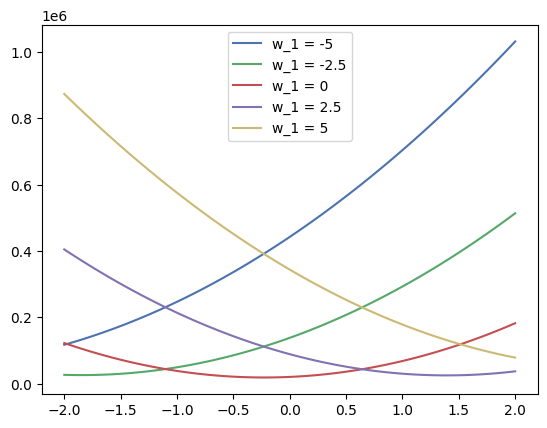

In [348]:
# Try weights -1 to 1 and plot the variance
w = np.linspace(-2, 2, 100)
variances = {
    -5 : [],
    -2.5 : [],
    0 : [],
    2.5 : [],
    5 : [],
}
for w_i in w:
    variances[-5].append(optim_func(np.array([w_i,-5])))
    variances[-2.5].append(optim_func(np.array([w_i,-2.5])))
    variances[0].append(optim_func(np.array([w_i,0])))
    variances[2.5].append(optim_func(np.array([w_i,2.5])))
    variances[5].append(optim_func(np.array([w_i,5])))
     
plt.plot(w, variances[-5], label='w_1 = -5')
plt.plot(w, variances[-2.5], label='w_1 = -2.5')
plt.plot(w, variances[0], label='w_1 = 0')
plt.plot(w, variances[2.5], label='w_1 = 2.5')
plt.plot(w, variances[5], label='w_1 = 5')

# Show legend 
plt.legend()

Month 1
Month 2
Month 3
Month 4
Month 5
Month 6
Month 7
Month 8
Month 9
Month 10
Month 11
Month 12


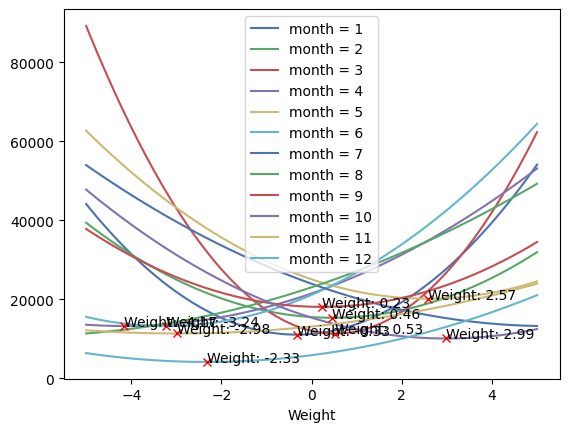

In [393]:
from scipy.optimize import minimize

def optim_func(w,df):
    # Compute the total variance, s.t. VAR(revenue_column + SUM(w_i * derivative_columns))
    # We want to minimize this
    return np.var(df[revenue_column].values + np.dot(w, df[derivative_columns].values.T))

w = np.linspace(-5, 5, 100)
variances = {}
optimal_weights = {}
# For every month instead..
for i in range(1,13):
    print(f"Month {i}")
    df = example_df[example_df.index.month==i]
    variances[i] = []
    for w_i in w:
        variances[i].append(optim_func(np.array([w_i, 0]), df))
    # Find the optimal weights
    bounds = [(-25,25), (0,0)]
    optimal_weight = minimize(optim_func, x0=np.array([0,0]), args=(df), method='Nelder-Mead', tol=1e-6, bounds=bounds )
    optimal_weights[i] = {
        'x' : optimal_weight.x,
        'fun' : optimal_weight.fun
    }

# variances to dataframe
variances_df = pd.DataFrame(variances)
variances_df['weight'] = w
variances_long_df = variances_df.melt(id_vars=['weight'], var_name='month', value_name='variance')
# Plot the variances (columns corresponding to month)
fig, ax = plt.subplots()

# Plot the variances (columns corresponding to month)
plt.plot(variances_df['weight'], variances_df[1], label='month = 1')
plt.plot(variances_df['weight'], variances_df[2], label='month = 2')
plt.plot(variances_df['weight'], variances_df[3], label='month = 3')
plt.plot(variances_df['weight'], variances_df[4], label='month = 4')
plt.plot(variances_df['weight'], variances_df[5], label='month = 5')
plt.plot(variances_df['weight'], variances_df[6], label='month = 6')
plt.plot(variances_df['weight'], variances_df[7], label='month = 7')
plt.plot(variances_df['weight'], variances_df[8], label='month = 8')
plt.plot(variances_df['weight'], variances_df[9], label='month = 9')
plt.plot(variances_df['weight'], variances_df[10], label='month = 10')
plt.plot(variances_df['weight'], variances_df[11], label='month = 11')
plt.plot(variances_df['weight'], variances_df[12], label='month = 12')
# Set the x-axis to be the weights
ax.set_xlabel('Weight')
# Plot the optimal weights as red crosses on the plot with x0 being the x and fun being the y. Add the weight to the text label
for month, optimal_weight in optimal_weights.items():
    # Only if x0 is between -5 and 5
    if optimal_weight['x'][0] > -5 and optimal_weight['x'][0] < 5:
        plt.plot(optimal_weight['x'][0], optimal_weight['fun'], 'rx')
        plt.text(optimal_weight['x'][0], optimal_weight['fun'], f"Weight: {optimal_weight['x'][0]:.2f}")
    
# Show legend
plt.legend()

In [329]:
from scipy.optimize import minimize

# Minimize the variance 

w_min = minimize(optim_func, np.array([0,0]), method='Nelder-Mead', tol=1e-6)


TypeError: minimize() got an unexpected keyword argument 'df'